# __Data Mining 27 - Clustering__

### Features that are going to be used in the model (based on RFM model + other features)
- __Recency__ -> How recently has a customer used the service:
    - last time a customer went to the gym: **'n_recency'**
<br><br>    
- __Frequency__ -> How often has a customer used the service, variables that are going to be used:

    - going to the gym: **'n_frequenciesWeek'**
    - going to a class: **'n_classesWeek'**
<br><br>
- __Monetary value__ -> How much money has a customer spent or can spend:

    - average spend per month: **'n_spendMonth'**
<br><br>
- __Loyalty__ -> How long has a customer been a customer:
    - time as a customer: **'n_timeAsCustomer'**

______________________________________________________________________

We are thinking of 5 clusters that are going to be used to segment the customers:
1. **Fitness Enthusiasts**: Regular, goal-oriented attendees.
2. **Casual Users**: Irregular attendance, less focused on specific goals.
3. **Group Class Participants**: Engage primarily in group activities.
4. **Health & Wellness Seekers**: Focused on overall health, not just fitness.
5. **Special Needs Clients**: Includes seniors, rehabilitation, or specific training needs.

______________________________________________________________________

## __0. Importing libraries and data__

In [3]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
from collections import Counter
import os
import time 

# Scaling and PCA
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.decomposition import PCA

# Clustering
from sklearn.cluster import KMeans, DBSCAN, MeanShift, estimate_bandwidth, AgglomerativeClustering
from sklearn.metrics import silhouette_score, silhouette_samples
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.mixture import GaussianMixture

# Dimensionality Reduction
from sklearn.manifold import TSNE
from umap import UMAP

# Self Organizing Maps
from sompy import SOMFactory
from sompy.visualization.mapview import View2D
from sompy.visualization.bmuhits import BmuHitsView
from sompy.visualization.hitmap import HitMapView
from sompy.visualization.umatrix import UMatrixView

In [4]:
data = pd.read_csv('../Datasets/data_cleaned.csv')

# Order columns by name
data = data.reindex(sorted(data.columns), axis=1)

numerical_features = [col for col in data.columns if col.startswith('n_')]
categorical_features = [col for col in data.columns if col.startswith('c_')]
binary_features = [col for col in data.columns if col.startswith('b_')]

# Create a dictionnary to store all the results (labels) of the clustering algorithms
label_results = {}
simple_algorithms = {}

## __1. Data Processing__

#### __Scaler__

In [5]:
data = data.dropna()
scaler = MinMaxScaler()
data[numerical_features] = scaler.fit_transform(data[numerical_features])

#### __PCA__

PCA for visualization purposes will not capture a big chunck of the variance (~45% of the variance). We have to be careful with the interpretation of the visualizations.

In [7]:
# Lets keep 3 components, as it explains already 70% of the variance
pca = PCA(n_components=3)
pca_features = pca.fit_transform(data[numerical_features])
pca_features = pd.DataFrame(pca_features, columns=['pca_1', 'pca_2', 'pca_3'])

data = pd.concat([data, pca_features], axis=1)

## __2. Clustering Models - Simple__

### 2.1. K-Means Clustering (stochastic)
- **n_clusters**: The number of clusters to form.
- **init**: Method for initialization, like 'k-means++' or random.
- **n_init**: Number of times the algorithm will run with different centroid seeds.

### 2.2. DBSCAN (mostly deterministic)
- **eps**: The maximum distance between two samples for one to be considered in the neighborhood of the other.
- **min_samples**: The number of samples in a neighborhood for a point to be considered a core point.

### 2.3. Mean Shift (Deterministic)
- **bandwidth**: Sets the size of the area (radius) around each data point to search for other data points. If not given, the bandwidth is estimated.
- **bin_seeding**: If true, initial kernel locations are not locations of all points, but rather the discretized version, leading to faster convergence.

### 2.4. Gaussian Mixture Models (stochastic)
- **n_components**: The number of mixture components (clusters).
- **covariance_type**: The type of covariance parameters to use (e.g., 'full', 'tied', 'diag', 'spherical').
- **init_params**: The method used for initialization (e.g., 'kmeans', 'random').

### 2.5. Hierarchical Clustering (mostly deterministic)
- **linkage criterion**: The linkage criterion determines which distance to use between sets of observation. E.g., 'ward', 'complete', 'average', 'single'.
- **distance metric**: The distance metric to use. The distance function can be 'euclidean', 'mahalanobis', etc.

### 2.6. Results 
- Analysing the plots and the results of the models.
______________________________________________________________________

### __FUNCTIONS__

In [8]:
def calculate_r2(data, centroids, detailed=False):
    # R2 = 1 - (SSB/SST), where SSB is the sum of squares between the clusters and SST is the total sum of squares. SST = SSB + SSW, where SSW is the sum of squares within the clusters.
    # Calculate SST
    if data.columns.str.startswith('b_').any() or data.columns.str.startswith('c_').any():
        raise Exception('Data contains categorical or binary features. Please remove them before calculating R2.')
    if not data.columns.str.contains('cluster').any():
        raise Exception('Data does not contain cluster column. Please run KMeans first.')

    def get_ss(df):
        ss = np.sum(df.var() * (df.count() - 1))
        return ss  # return sum of sum of squares of each df variable
    
    X = data.drop('cluster', axis=1)
    sst = get_ss(X)

    # Calculate SSW
    ssw = data.groupby('cluster').apply(get_ss).sum()

    # Calculate SSB
    ssb = sst - ssw
    
    if detailed:
        return {'sst': sst, 'ssw': ssw, 'ssb': ssb, 'r2': 1 - (ssb/sst)}
    else:
        return 1 - (ssb/sst)

In [9]:
def random_search (X, model, params_dict, n_iter=100, verbose=False, return_scores=False) : 
    best_score = 0
    best_params, silhouette_scores, r2_scores = {}, {}, {}
    for i in range(n_iter) : 
        params = {}

        # Generate the random parameters
        for param in params_dict : 
            params[param] = np.random.choice(params_dict[param])
        model.set_params(**params, n_jobs=-1)
        labels = model.fit_predict(X)

        # Predict labels
        X_ = pd.concat([X, pd.DataFrame(labels, columns=['cluster'])], axis=1)

        # Get centroids manually 
        centroids = pd.DataFrame.groupby(X_, 'cluster').mean().values

        # Calculate the scores - for the selection of the best parameters we will use the silhouette score
        score = silhouette_score(X, model.labels_)
        r2 = calculate_r2(X_, centroids)
        silhouette_scores[str(params)] = score
        r2_scores[str(params)] = r2

        # Update the best score and params
        if score > best_score : 
            best_score = score
            best_params = params

        # Count how many clusters we have
        clusters = Counter(labels)

        print(f'Iteration {i+1} - Params: {params} - Score: {score:.4f} - Best Score: {best_score:.4f} - Clusters: {clusters}') if verbose else None

    if return_scores : 
        return best_score, best_params, silhouette_scores, r2_scores
    else :
        return best_score, best_params

In [22]:
def display_clustering(X, clusters, title=None, figsize=(10, 5)):
    fig, axs = plt.subplots(1, 2, figsize=figsize)

    # PCA Plot 
    pca = PCA(n_components=2)
    pca_features = pca.fit_transform(X[numerical_features])
    pca_features = pd.DataFrame(pca_features, columns=['pca_1', 'pca_2'])
    colors = cm.nipy_spectral(clusters.astype(float) / clusters.max())
    axs[0].scatter(pca_features['pca_1'], pca_features['pca_2'], marker=".", s=12, lw=0, alpha=0.8, c=colors, edgecolor="k")

    # Plot the centroids
    pca_features['cluster'] = clusters
    centroids = pca_features.groupby('cluster').mean().values
    axs[0].scatter(centroids[:,0],centroids[:,1], marker="o", c="white", alpha=1, s=200, edgecolor="k")
    for centroid, i in zip(centroids, range(len(centroids))):
        axs[0].scatter(centroid[0], centroid[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    axs[0].set_title("PCA plot for the various clusters.")
    axs[0].set_xlabel("Feature space for the 1st feature")
    axs[0].set_ylabel("Feature space for the 2nd feature")

    # Add the UMAP plot ------------------------------------------------------------------------------------
    reducer = UMAP(n_neighbors=100)
    embedding = reducer.fit_transform(X[numerical_features])

    colors = cm.nipy_spectral(clusters.astype(float) / clusters.max())

    axs[1].scatter(embedding[:, 0], embedding[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k")    
    axs[1].set_title("UMAP plot for the various clusters.")
    axs[1].set_xlabel("Feature space for the 1st feature")
    axs[1].set_ylabel("Feature space for the 2nd feature")

    if title:
        plt.suptitle(title, fontsize=14, fontweight="bold")

    plt.show()

In [11]:
def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)


### 2.1 K-Means Clustering
We will use the K-Means Clustering algorithm with init='k-means++' and n_init=10, as it is standard and won't change too much the results. To find the optimal number of clusters, we have:
- 2.1.1. Evaluating n_clusters: K-Means Clustering - Elbow Method
- 2.1.2. K-Means Clustering - Silhouette Score

Results:
- 5 clusters seems like a strech. We will use 4 clusters.
- Good results for 4 clusters
______________________________________________________________________

#### 2.1.1. Evaluating n_clusters: K-Means Clustering - Elbow Method

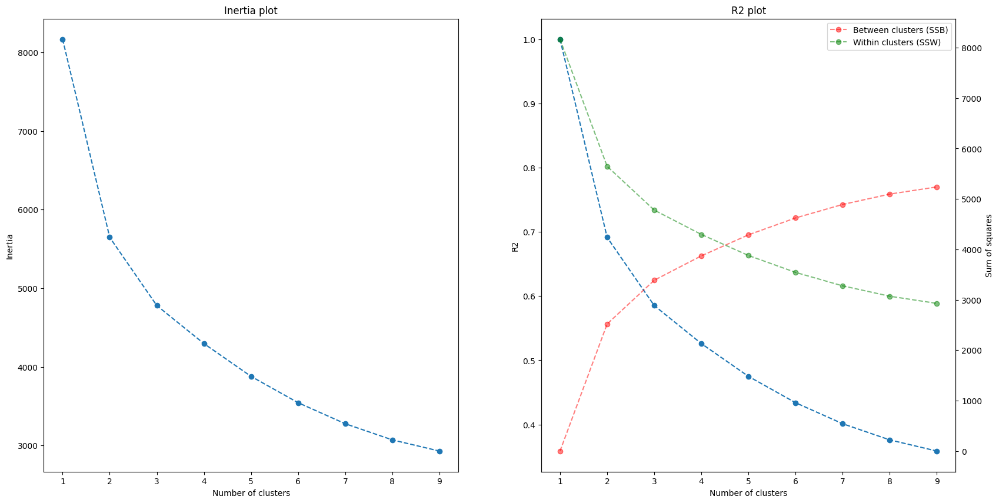

In [18]:
inertia, r2, sst, ssb, ssw = [], [], [], [], []
range_values = range(1, 10)  # Adjust this range based on your dataset

fig, axs = plt.subplots(1, 2, figsize=(20, 10))
for i in range_values:
    kmeans = KMeans(n_clusters=i, init='k-means++', n_init=10)
    kmeans.fit(data[numerical_features])

    # Calculate inertia
    inertia.append(kmeans.inertia_)

    # Calculate R2
    labels = pd.DataFrame(kmeans.labels_, columns=['cluster'])
    X = pd.concat([data[numerical_features], labels], axis=1)
    results = calculate_r2(X, kmeans.cluster_centers_, detailed=True)
    r2.append(results['r2'])
    sst.append(results['sst'])
    ssb.append(results['ssb'])
    ssw.append(results['ssw'])


# Plot the results
axs[0].plot(range_values, inertia, marker='o', linestyle='--')
axs[0].set_xlabel('Number of clusters')
axs[0].set_ylabel('Inertia')
axs[0].set_title('Inertia plot')

axs[1].plot(range_values, r2, marker='o', linestyle='--', label='R2')

# Change axis of the second plot
axs2 = axs[1].twinx()
axs2.plot(range_values, ssb, marker='o', linestyle='--', color='red', label='Between clusters (SSB)', alpha=0.5)
axs2.plot(range_values, ssw, marker='o', linestyle='--', color='green', label='Within clusters (SSW)', alpha=0.5)
axs2.set_ylabel('Sum of squares')
axs2.legend(loc='best')
axs[1].set_xlabel('Number of clusters')
axs[1].set_ylabel('R2')
axs[1].set_title('R2 plot')

plt.show()

Based on the elbow method, we would select 2-3 clusters. With the R2 plot, where 0.5 is an ideal value, we can see that 2-4 clusters would be good.

#### 2.1.2. Evaluating n_clusters: K-Means Clustering - Silhouette Score

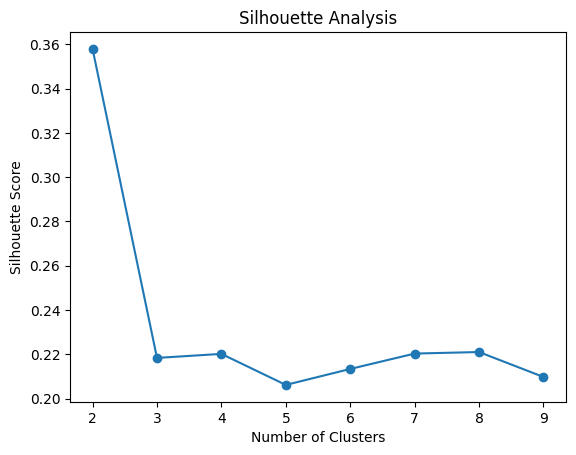

In [21]:
silhouette_scores = []

range_values = range(2, 10)
for i in range_values:
    kmeans = KMeans(n_clusters=i, init='k-means++', n_init=10)
    kmeans_clusters = kmeans.fit_predict(data[numerical_features])
    score = silhouette_score(data[numerical_features], kmeans_clusters)
    silhouette_scores.append(score)

plt.plot(range_values, silhouette_scores, 'o-')
plt.title('Silhouette Analysis')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.show()

For n_clusters = 2 The average silhouette_score is : 0.3579178560090086
For n_clusters = 3 The average silhouette_score is : 0.3267482993426435
For n_clusters = 4 The average silhouette_score is : 0.22021496562772144
For n_clusters = 5 The average silhouette_score is : 0.20800767423253377


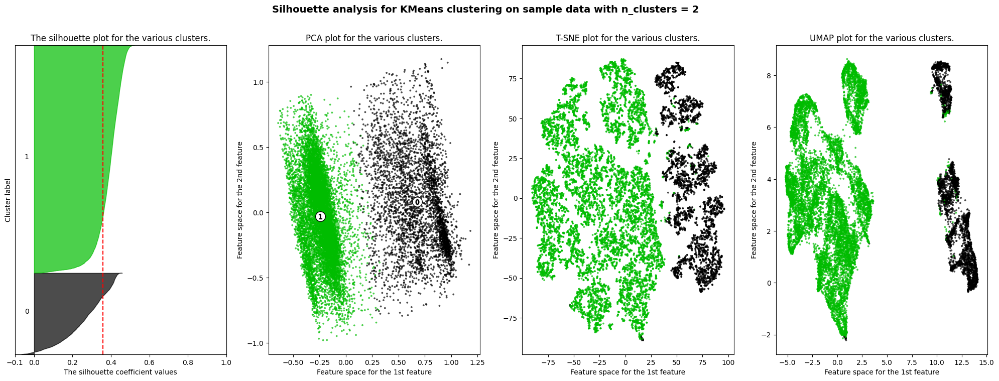

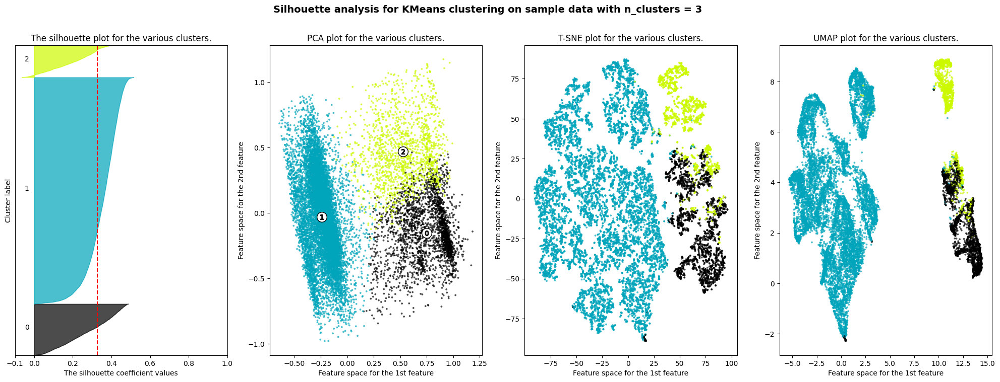

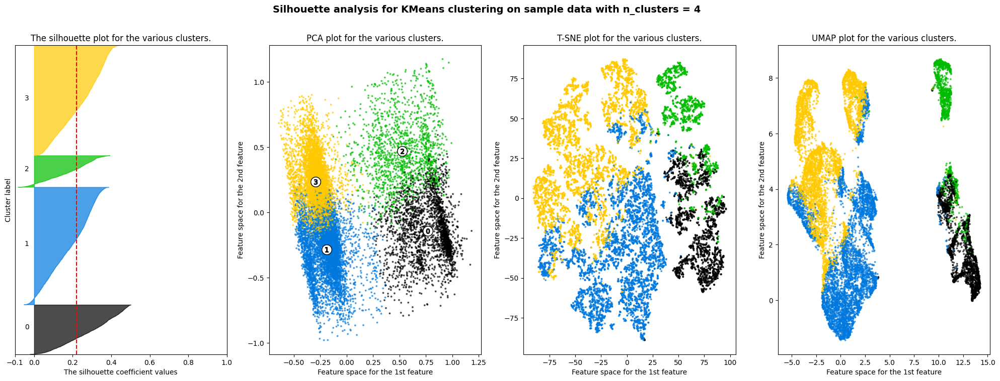

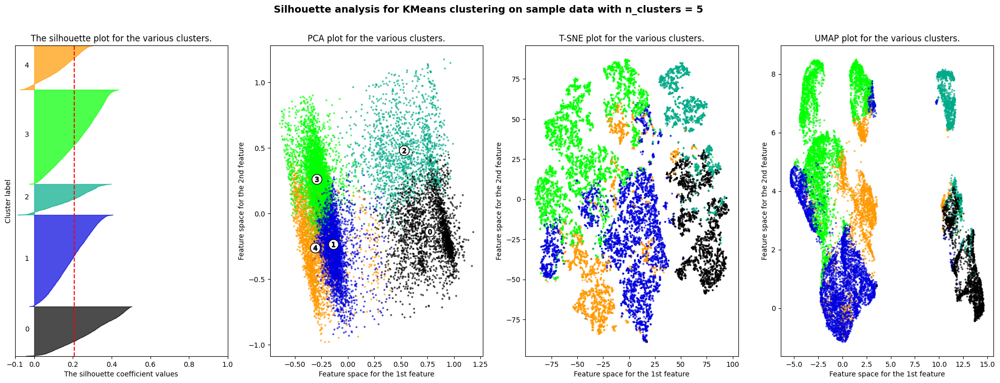

In [107]:
X = data[numerical_features]
range_n_clusters = [2, 3, 4, 5]

for n_clusters in range_n_clusters:
    # Initialize the plot with the specified dimensions.
    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4)
    fig.set_size_inches(25, 8)
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer and predict clusters
    clusterer = KMeans(n_clusters=n_clusters, n_init="auto", random_state=10)
    cluster_labels = clusterer.fit_predict(X)
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters, "The average silhouette_score is :", silhouette_avg)
    
    # Create the silhouette plot
    sample_silhouette_values = silhouette_samples(X, cluster_labels)
    y_lower = 10
    for i in range(n_clusters):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        color = cm.nipy_spectral(float(i) / n_clusters)

        ax1.fill_betweenx(np.arange(y_lower, y_upper), 0, ith_cluster_silhouette_values, facecolor=color, edgecolor=color, alpha=0.7)
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
        y_lower = y_upper + 10

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")
    ax1.set_yticks([])
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])


    # Plot the pca components ------------------------------------------------------------------------------------
    pca = PCA(n_components=2)
    pca_features = pca.fit_transform(X)
    pca_features = pd.DataFrame(pca_features, columns=['pca_1', 'pca_2'])
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(pca_features['pca_1'], pca_features['pca_2'], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k")

    # Plot the centroids as well
    # Plot the centroids
    pca_features['cluster'] = cluster_labels
    centroids = pca_features.groupby('cluster').mean().values
    ax2.scatter(centroids[:,0],centroids[:,1], marker="o", c="white", alpha=1, s=200, edgecolor="k")
    for centroid, i in zip(centroids, range(len(centroids))):
        ax2.scatter(centroid[0], centroid[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("PCA plot for the various clusters.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")


    # Now for the 2nd plot - the visualization ------------------------------------------------------------------------------------
    tsne = TSNE(n_components=2)  # number of dimensions to project to
    X_tsne = tsne.fit_transform(X) 

    # For the samples 
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax3.scatter(X_tsne[:, 0], X_tsne[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k")

    ax3.set_title("T-SNE plot for the various clusters.")
    ax3.set_xlabel("Feature space for the 1st feature")
    ax3.set_ylabel("Feature space for the 2nd feature")

    # Add the UMAP plot ------------------------------------------------------------------------------------
    reducer = UMAP(n_neighbors=100)
    embedding = reducer.fit_transform(X)
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax4.scatter(embedding[:, 0], embedding[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k")

    ax4.set_title("UMAP plot for the various clusters.")
    ax4.set_xlabel("Feature space for the 1st feature")
    ax4.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data with n_clusters = %d" % n_clusters), fontsize=14, fontweight="bold")

plt.show()


- From looking at all this data, 5 seems a little out of reach for now. We would consider 3-4 clusters.
- Lets try now 4 clusters and see how th results look like.

In [20]:
# Cluster the data with 4 clusters
kmeans = KMeans(n_clusters=4, init='k-means++', n_init=50, random_state=10)
simple_algorithms['kmeans4'] = kmeans
kmeans_clusters = kmeans.fit_predict(data[numerical_features])
data['cluster'] = kmeans_clusters

# Check how the clusters are distributed
clusters = Counter(kmeans_clusters)
print(clusters)
data[numerical_features+binary_features+['cluster']].groupby('cluster').mean().T.style.background_gradient(axis=1)

label_results['simple_kmeans4'] = data['cluster']

Counter({2: 5617, 0: 5407, 1: 2412, 3: 1505})


#### Data to display:

UMAP start
embedding done
colors done
scatter done


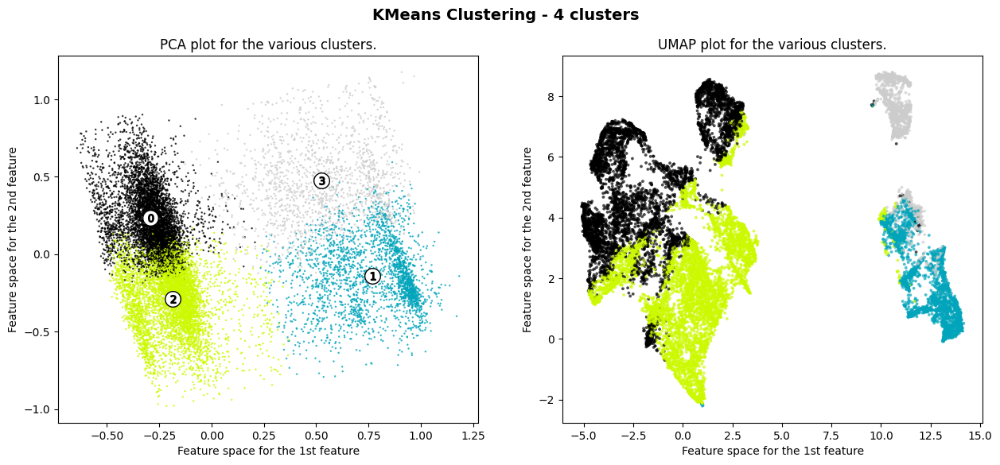

In [21]:
display_clustering(data, kmeans_clusters, title='KMeans Clustering - 4 clusters', figsize=(15,6))

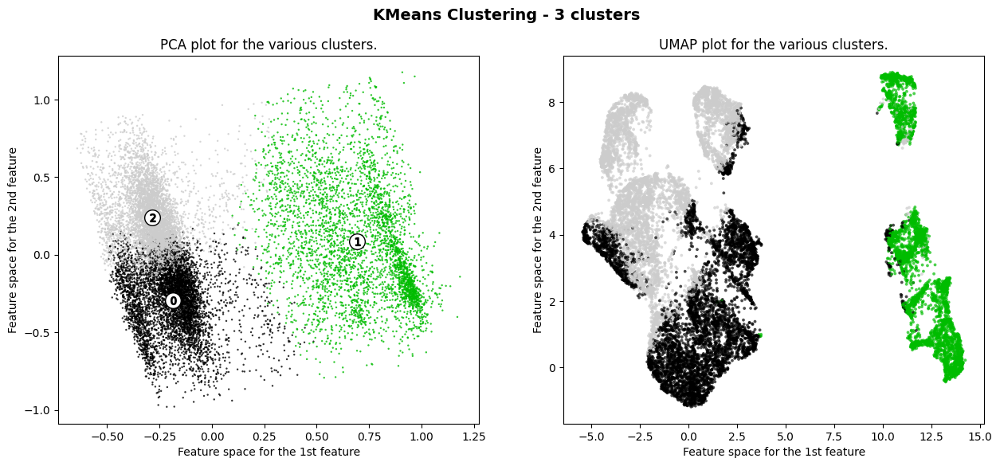

In [30]:
# Cluster the data with 3 clusters
kmeans = KMeans(n_clusters=3, init='k-means++', n_init=50)
simple_algorithms['kmeans3'] = kmeans
kmeans_clusters = kmeans.fit_predict(data[numerical_features])
data['cluster'] = kmeans_clusters
label_results['simple_kmeans3'] = data['cluster']

display_clustering(data, kmeans_clusters, title='KMeans Clustering - 3 clusters', figsize=(15,6))

In [31]:
# Add also the 5 clusters to the results 
kmeans = KMeans(n_clusters=5, init='k-means++', n_init=50)
simple_algorithms['kmeans5'] = kmeans
kmeans_clusters = kmeans.fit_predict(data[numerical_features])
data['cluster'] = kmeans_clusters
label_results['simple_kmeans5'] = data['cluster']

### 2.2. DBSCAN (mostly deterministic)
We only have to change the epsilon and min_samples parameters. We will use the default values for the rest of the parameters.
- 2.2.1. Evaluating eps: DBSCAN - Elbow Method on the k-dist graph with fixed min_samples (usually 2*dim is a good starting point). The plot is made with the n_neighbors parameter set to k=min_pts - 1
- 2.2.2. Evaluating min_samples and eps: DBSCAN - Random Search
- 2.2.3. Using DBSCAN to eliminate outliers

Results : 
- 3 clusters with params 'eps': 0.294, 'min_samples': 17
- K-Means clustering seems to be better 
______________________________________________________________________

#### 2.2.1 Evaluating eps: DBSCAN - Elbow Method on the k-dist graph with fixed min_samples (usually 2*dim is a good starting point)

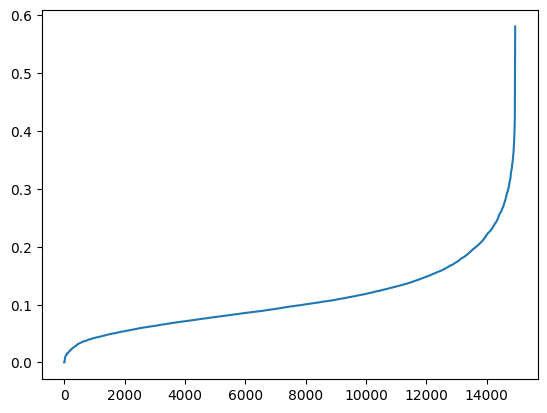

In [17]:
# Plot the k-dist plot
from sklearn.neighbors import NearestNeighbors
neigh = NearestNeighbors(n_neighbors=16)
nbrs = neigh.fit(X)
distances, indices = nbrs.kneighbors(X)
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

Lets start with an epsilon of 0.25. What are the results?

In [82]:
dbscan = DBSCAN(eps=0.25, min_samples=15)
clusters = dbscan.fit_predict(X)

Counter(clusters)

Counter({-1: 1892,
         0: 10514,
         2: 1895,
         1: 458,
         3: 123,
         8: 14,
         7: 16,
         6: 7,
         4: 4,
         5: 18})

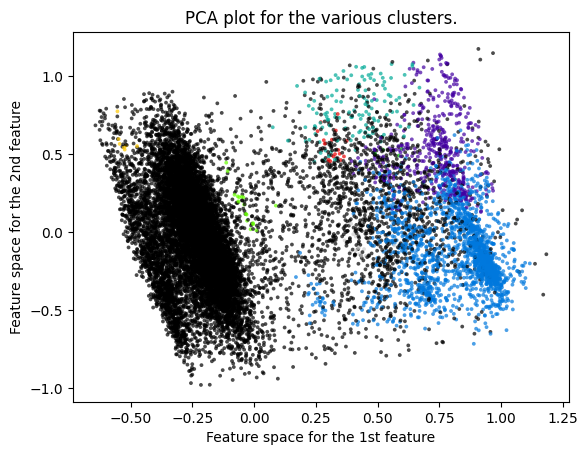

In [83]:
# Plot the clusters
pca = PCA(n_components=2)
pca_features = pca.fit_transform(X)
pca_features = pd.DataFrame(pca_features, columns=['pca_1', 'pca_2'])
colors = cm.nipy_spectral(clusters.astype(float) / clusters.max())
plt.scatter(pca_features['pca_1'], pca_features['pca_2'], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k")
plt.title("PCA plot for the various clusters.")
plt.xlabel("Feature space for the 1st feature")
plt.ylabel("Feature space for the 2nd feature")
plt.show()

Not good. Lets move on to step 2

#### 2.2.2. Evaluating min_samples and eps: DBSCAN - Random Search
- Lets set up a random search for min samples and the epsilon value

In [ ]:
X = data[numerical_features]

params_dict = {
    'eps': [val / 3000 for val in range(300, 900)],  # From 0.1 to 0.3, now from 0.3 to 0.4
    'min_samples': [val for val in range(1, 50)]
}

best_score, best_params, silhouettes, r2 = random_search(X, DBSCAN(), params_dict, n_iter=200, verbose=True, return_scores=True)

silhouette_scores = pd.DataFrame.from_dict(silhouettes, orient='index', columns=['score'])
silhouette_scores.reset_index(level=0, inplace=True)

# Rename the new column
silhouette_scores = silhouette_scores.rename(columns={'index': 'parameters'})

# Convert the 'parameters' column into a DataFrame and concatenate it with 'score'
silhouette_scores = pd.concat([silhouette_scores['parameters'].apply(pd.Series), silhouette_scores['score']], axis=1)

silhouette_scores['eps'] = silhouette_scores.apply(lambda row: row[0].split(',')[0].split(':')[1], axis=1)
silhouette_scores['min_samples'] = silhouette_scores.apply(lambda row: row[0].split(',')[1].split(':')[1].split('}')[0], axis=1)
silhouette_scores.drop(0, axis=1, inplace=True)

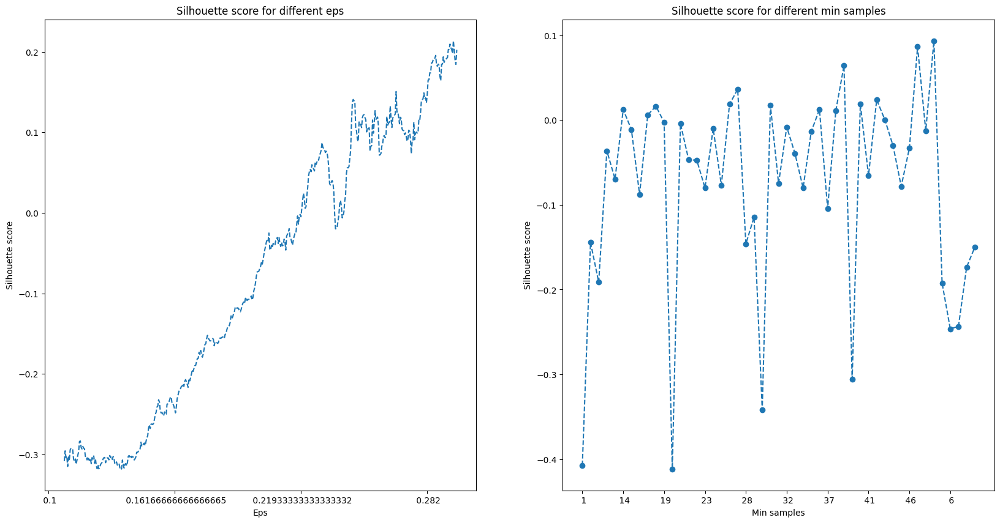

In [95]:
# Plot how the silhouette score changes with the parameters
fig, axs = plt.subplots(1, 2, figsize=(20, 10))
eps = silhouette_scores.groupby('eps').mean(numeric_only=True).rolling(20).mean().sort_index()
min_samples = silhouette_scores.groupby('min_samples').mean(numeric_only=True).sort_index()

axs[0].plot(eps.index, eps['score'], linestyle='--')
axs[0].set_xlabel('Eps')
axs[0].set_ylabel('Silhouette score')
axs[0].set_title('Silhouette score for different eps')
axs[0].set_xticks(eps.index[::150])

axs[1].plot(min_samples.index, min_samples['score'], marker='o', linestyle='--')
axs[1].set_xlabel('Min samples')
axs[1].set_ylabel('Silhouette score')
axs[1].set_title('Silhouette score for different min samples')
# Change the xticks so that there are less of them
axs[1].set_xticks(min_samples.index[::5])

plt.show()

In [43]:
# Run the model with the best parameters (0.294, 17)
X = data[numerical_features]
best_params = {'eps': 0.294, 'min_samples': 17}
dbscan = DBSCAN(**best_params)
simple_algorithms['dbscan'] = dbscan
dbscan_clusters = dbscan.fit_predict(X)

Counter(dbscan_clusters)

Counter({0: 10720, 1: 2338, -1: 1081, 2: 802})

##### What are the main differences in features between the clusters?

In [45]:
X = data.copy()
X['cluster'] = dbscan_clusters 
X[binary_features + numerical_features + ['cluster']].groupby('cluster').mean(numeric_only=True).T.style.background_gradient(axis=1)

cluster,-1,0,1,2
b_combatActivities,0.058279,0.134608,0.035073,0.026185
b_dropout,0.783534,0.848881,0.544482,0.931421
b_fitnessActivities,0.282146,0.762034,0.044055,0.056110
b_gender,0.609621,0.601213,0.573139,0.605985
b_rareActivities,15.171138,2.770522,8.725406,11.471322
b_teamActivities,0.264570,0.012873,0.097947,0.218204
b_useByTime,0.031452,0.061007,0.005560,0.003741
b_waterActivities,0.409806,0.150466,0.792130,0.630923
n_allowedWeeklyVisits,0.446500,0.998050,0.209267,0.179967
n_classesVisit,0.323745,0.004741,0.428146,0.436214


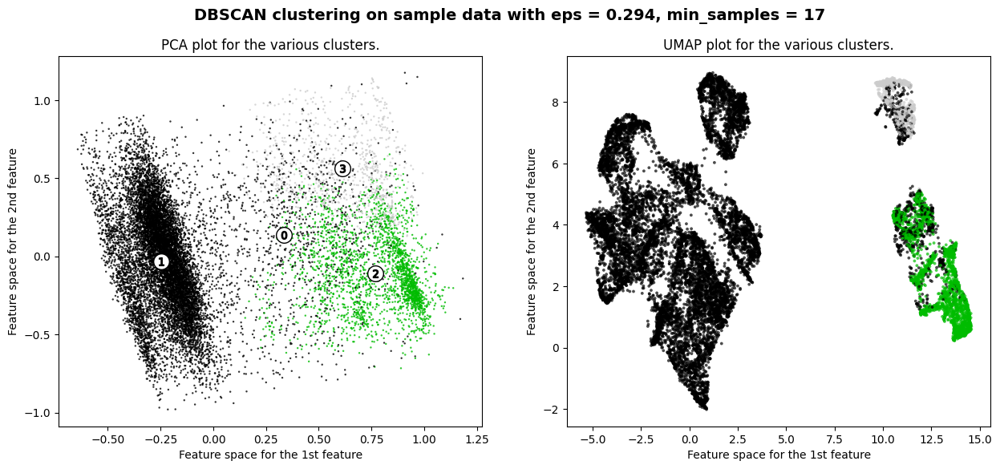

In [142]:
display_clustering(X, dbscan_clusters, title="DBSCAN clustering on sample data with eps = {}, min_samples = {}".format(best_params['eps'], best_params['min_samples']), figsize=(15,6))

In [46]:
label_results['dbscan'] = X['cluster']

#### 2.2.3 Using DBSCAN for outlier removal 

In [99]:
# Run the model with the best parameters (0.37, 20)
X = data[numerical_features]
best_params = {'eps': 0.37, 'min_samples': 20}
dbscan = DBSCAN(**best_params)
dbscan_clusters = dbscan.fit_predict(X)

counts = Counter(dbscan_clusters)
outliers = counts[-1] / (counts[0] + counts[-1])
print(counts)
print(f'Outliers removed: {outliers:.2%}')

Counter({0: 14648, -1: 293})
Outliers removed: 1.96%


In [100]:
# How are the outliers distributed?
X = data.copy()
dropped = [col for col in X.columns if col.startswith('drop_')]
X['cluster'] = dbscan_clusters
X[binary_features + numerical_features + ['cluster'] + dropped].groupby('cluster').mean(numeric_only=True).T.style.background_gradient(axis=1)

cluster,-1,0
b_combatActivities,0.044369,0.108957
b_dropout,0.744027,0.802089
b_fitnessActivities,0.245734,0.583697
b_gender,0.610922,0.597419
b_rareActivities,17.406143,4.819771
b_teamActivities,0.300341,0.050519
b_useByTime,0.020478,0.047652
b_waterActivities,0.406143,0.293214
n_allowedWeeklyVisits,0.480205,0.797014
n_classesVisit,0.276571,0.114050


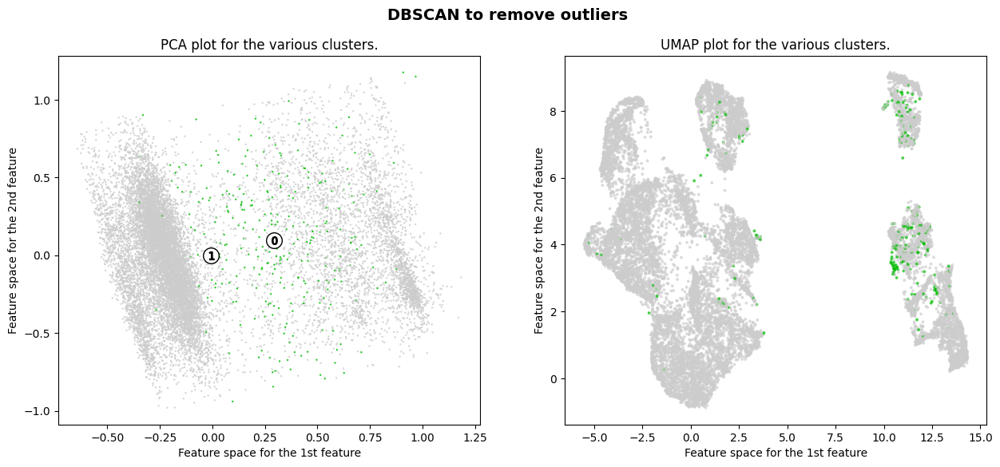

In [101]:
display_clustering(X, dbscan_clusters+2, title='DBSCAN to remove outliers', figsize=(15,6))

Doesnt seem to be all that useful. Lets move on to the next model, and then implement the outlier removal if needed.

In [128]:
data_outliers_removed = data[dbscan_clusters != -1]

### 2.3. Mean Shift (Deterministic)
- 2.3.1. Using the estimate bandwidth function to find the optimal bandwidth, always with bin seeding set to True

Results:
- 4 clusters with parameters bandwidth=0.5663, bin_seeding=True. The results are not the best.
______________________________________________________________________

#### 2.3.1. Using the estimate bandwidth function to find the optimal bandwidth 
##### General Rule:

- A lower quantile (e.g., 0.1 to 0.3) results in a smaller bandwidth, leading to more clusters with finer granularity.
- A higher quantile (e.g., 0.4 to 0.9) results in a larger bandwidth, leading to fewer, larger clusters.

##### Data Density and Size:

- For dense datasets or those with many points, a smaller quantile can be more appropriate, as it allows for finer distinctions between clusters.
- For sparse datasets or those with fewer points, a higher quantile might be better to avoid over-segmentation.

In [ ]:
range_quantiles = [val / 250 for val in range(1, 80)]
bandwidths, sil_scores, r2_scores = [], [], []

for quantile in range_quantiles:
    bandwidth = estimate_bandwidth(data[numerical_features], quantile=quantile, n_jobs=-1)
    bandwidths.append(bandwidth)

    # Fit the model 
    meanshift = MeanShift(bandwidth=bandwidth, bin_seeding=True, n_jobs=-1)
    clusters = meanshift.fit_predict(data[numerical_features])

    # Calculate scores
    score = silhouette_score(data[numerical_features], clusters)
    labels = pd.DataFrame(clusters, columns=['cluster'])
    X = pd.concat([data[numerical_features], labels], axis=1)
    r2 = calculate_r2(X, meanshift.cluster_centers_)
    sil_scores.append(score)
    r2_scores.append(r2)

    # Calculate the number of clusters
    clusters = Counter(clusters)
    print(f'Quantile: {quantile} - Bandwidth: {bandwidth:.4f} - Silhouette score: {score:.4f} - R2: {r2:.4f} - Clusters: {clusters}')

This is our best score:

Quantile: 0.08 - Bandwidth: 0.5663 - Silhouette score: 0.2660 - R2: 0.6708 - Clusters: Counter({0: 11109, 1: 3277, 2: 325, 3: 230})


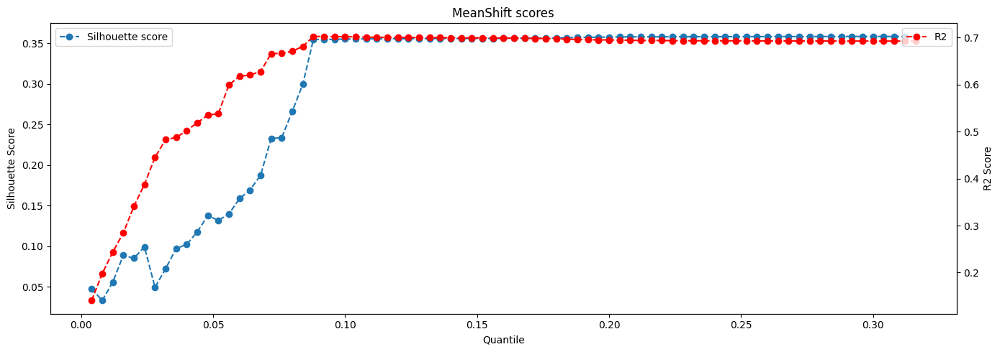

In [29]:
# Get the data frame with the results
ms_param_stats = pd.DataFrame({'quantile': range_quantiles, 'bandwidth': bandwidths, 'silhouette_score': sil_scores, 'r2': r2_scores})

# Plot the results
plt.figure(figsize=(14, 5))
plt.plot(range_quantiles, sil_scores, marker='o', linestyle='--', label='Silhouette score')
plt.xlabel('Quantile')
plt.ylabel('Silhouette Score')
plt.legend(loc='upper left')
ax2 = plt.twinx()
ax2.plot(range_quantiles, r2_scores, marker='o', linestyle='--', color='red', label='R2')
plt.xlabel('Quantile')
plt.ylabel('R2 Score')
plt.title('MeanShift scores')
plt.legend(loc='upper right')
plt.tight_layout()
plt.show()

In [102]:
# Meanshift clustering
X = data.copy()
meanshift = MeanShift(bandwidth=0.5663, n_jobs=-1)
simple_algorithms['meanshift'] = meanshift
meanshift_clusters = meanshift.fit_predict(X[numerical_features])
X['cluster'] = meanshift_clusters
label_results['meanshift_4'] = X['cluster']

# Check how the clusters are distributed
clusters = Counter(meanshift_clusters)
print(clusters)

Counter({0: 11109, 1: 3277, 2: 325, 3: 230})


##### Lets see our result

In [36]:
X[numerical_features+binary_features+['cluster', 'drop_n_age']].groupby('cluster').mean().T.style.background_gradient(axis=1)

cluster,0,1,2,3
n_allowedWeeklyVisits,0.980676,0.207731,0.605949,0.188551
n_classesVisit,0.017485,0.410506,0.321007,0.468892
n_frequenciesWeek,0.530785,0.473961,0.293801,0.521180
n_income,0.530204,0.157358,0.936912,0.762528
n_ratioUtilization,0.449443,0.538484,0.303900,0.591632
n_recency,0.406814,0.270873,0.395536,0.538617
n_spentPerMonth,0.381201,0.508907,0.458582,0.669619
n_timeAsCustomer,0.609687,0.705286,0.670854,0.478495
b_combatActivities,0.132145,0.036314,0.061538,0.008696
b_dropout,0.852822,0.631065,0.723077,0.826087


##### Graphically

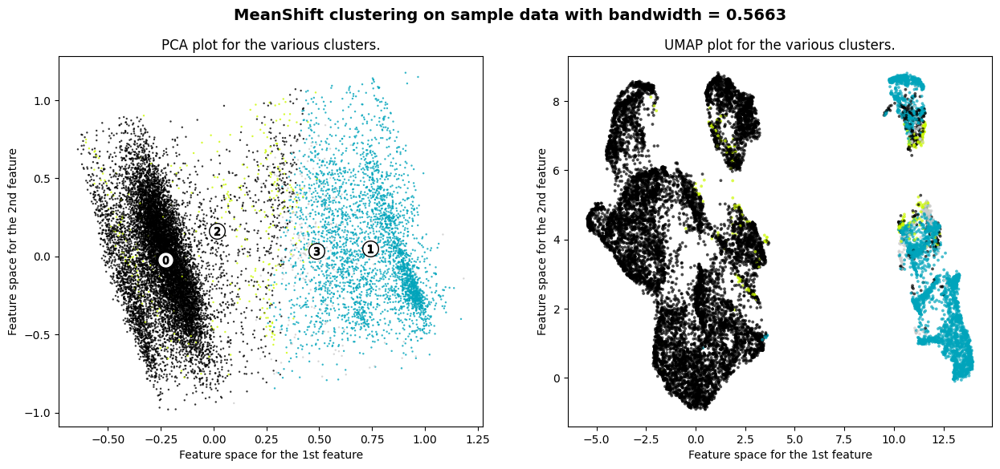

In [133]:
display_clustering(X, meanshift_clusters, title="MeanShift clustering on sample data with bandwidth = 0.5663", figsize=(15, 6))

Cluster 2 is clearly not good. The problem is that we have a change in density in the data. And between clusters 0 and 1, we have a low density.

### 2.4. Gaussian Mixture Models (stochastic)
- 2.4.1. Using AIC and BIC to determine the n_components
- 2.4.2. Testing the covariance type (make a table with the time waited) -> 'full', 'tied', 'diag', 'spherical'
- 2.4.3. Testing the init_params parameter -> 'kmeans', 'random', 'k-means++', 'random_from_data'
- 2.4.4. Checking which number of components is best (from what the AIC and BIC said).
______________________________________________________________________

#### 2.4.1. Method: AIC/BIC Approach:
- BIC/AIC can be particularly useful as it balances model complexity with goodness of fit.
- Calculate BIC/AIC for a range of n_components and choose the one with the lowest BIC/AIC value.

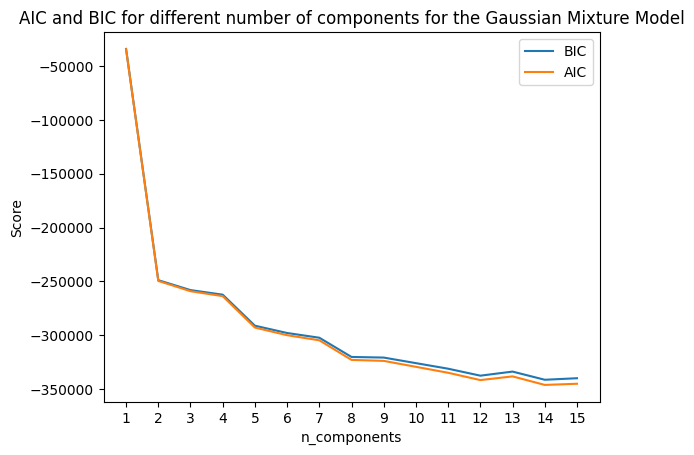

In [54]:
# Selecting number of components based on AIC and BIC
n_components = np.arange(1, 16)
models = [GaussianMixture(n, covariance_type='full', n_init=10, random_state=1).fit(data[numerical_features])
          for n in n_components]

bic_values = [m.bic(data[numerical_features]) for m in models]
aic_values = [m.aic(data[numerical_features]) for m in models]
plt.plot(n_components, bic_values, label='BIC')
plt.plot(n_components, aic_values, label='AIC')
plt.title('AIC and BIC for different number of components for the Gaussian Mixture Model')
plt.legend(loc='best')
plt.xlabel('n_components')
plt.ylabel('Score') 
plt.xticks(n_components)
plt.show()

Well, 2 is the obviuous choice, as it is quite an elbow. But 3 and 4 are better options, based on our intuition and what is useful for the business. 5 could also be a good option. Lets check the results.

####  2.4.2. Testing the covariance type (make a table with the time waited) -> 'full', 'tied', 'diag', 'spherical'
- We will only use the BIC, as they are more or less equivalent. We will use the n_components=4, as it is the best option.

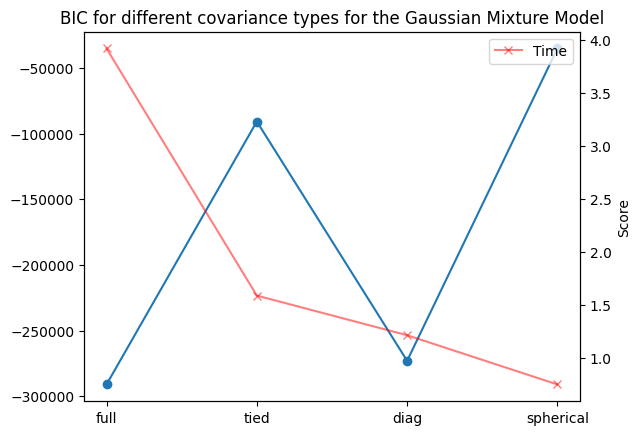

In [65]:
covariance_type = ['full', 'tied', 'diag', 'spherical']

models, times = [], []

for covariance in covariance_type:
    start = time.time()
    model = GaussianMixture(5, covariance_type=covariance, n_init=10, random_state=1).fit(data[numerical_features])
    end = time.time()
    times.append(end - start)
    models.append(model)

bic_values = [m.bic(data[numerical_features]) for m in models]
plt.plot(covariance_type, bic_values, label='BIC', marker='o')
ax2 = plt.twinx()
ax2.plot(covariance_type, times, marker='x', color='red', label='Time', alpha=0.5)
ax2.set_ylabel('Time (s)')
plt.title('BIC for different covariance types for the Gaussian Mixture Model')
plt.legend(loc='best')
plt.xlabel('Covariance type')
plt.ylabel('Score')
plt.show()

Its clear that the best option is 'full'. Of course, it is the most computationally expensive, but our dataset is not that big.

#### 2.4.3. Testing the init_params parameter -> 'kmeans', 'random', 'k-means++', 'random_from_data'

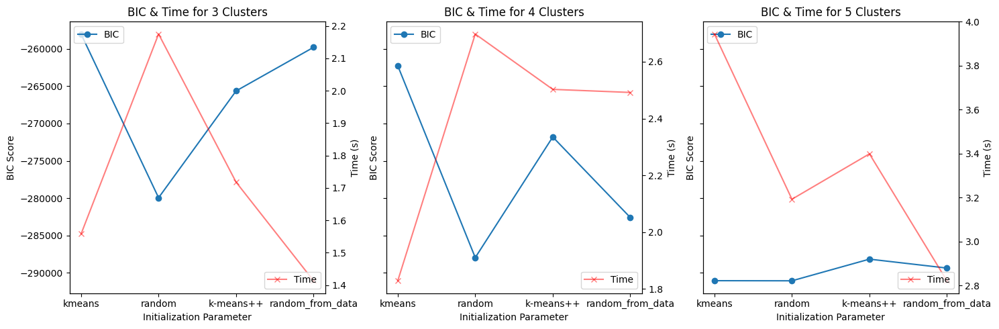

In [69]:
init_params = ['kmeans', 'random', 'k-means++', 'random_from_data']
cluster_numbers = [3, 4, 5]
models = {n: [] for n in cluster_numbers}
times = {n: [] for n in cluster_numbers}

for n_clusters in cluster_numbers:
    for init in init_params:
        start = time.time()
        model = GaussianMixture(n_clusters, covariance_type='full', n_init=10, init_params=init, random_state=1).fit(data[numerical_features])
        end = time.time()
        times[n_clusters].append(end - start)
        models[n_clusters].append(model)

fig, axs = plt.subplots(1, len(cluster_numbers), figsize=(15, 5), sharey=True)

for i, n_clusters in enumerate(cluster_numbers):
    bic_values = [m.bic(data[numerical_features]) for m in models[n_clusters]]
    axs[i].plot(init_params, bic_values, label='BIC', marker='o')
    ax2 = axs[i].twinx()
    ax2.plot(init_params, times[n_clusters], marker='x', color='red', label='Time', alpha=0.5)
    ax2.set_ylabel('Time (s)')
    axs[i].set_title(f'BIC & Time for {n_clusters} Clusters')
    axs[i].set_xlabel('Initialization Parameter')
    axs[i].set_ylabel('BIC Score')
    axs[i].legend(loc='upper left')
    ax2.legend(loc='lower right')

plt.tight_layout()
plt.show()


We have a clear winner: 'random' is the best option. It is also one of the slower options, but its ok. We have a random state, so we can be sure that the results are not caused by randomness.

#### 2.4.4. Checking which number of components is best (from what the AIC and BIC said).

In [103]:
# Fit a Gaussian Mixture Model with 3,4 and 5 clusters
X = data[numerical_features].copy()
gmm3 = GaussianMixture(3, covariance_type='full', n_init=10, init_params='random', random_state=1)
gmm4 = GaussianMixture(4, covariance_type='full', n_init=10, init_params='random', random_state=1)
gmm5 = GaussianMixture(5, covariance_type='full', n_init=10, init_params='random', random_state=1)

# Save the algorithms
simple_algorithms['gmm3'] = gmm3
simple_algorithms['gmm4'] = gmm4
simple_algorithms['gmm5'] = gmm5

# Fit the models
gmm3.fit(X)
gmm4.fit(X)
gmm5.fit(X)

# Predict the clusters
gmm3_clusters = gmm3.predict(X)
gmm4_clusters = gmm4.predict(X)
gmm5_clusters = gmm5.predict(X)

# Add the clusters to the data
X['cluster_3'] = gmm3_clusters
X['cluster_4'] = gmm4_clusters
X['cluster_5'] = gmm5_clusters

# Add the clusters to the results
label_results['gmm3'] = X['cluster_3']
label_results['gmm4'] = X['cluster_4']
label_results['gmm5'] = X['cluster_5']

# Check how the clusters are distributed
print(Counter(gmm3_clusters))
print(Counter(gmm4_clusters))
print(Counter(gmm5_clusters))

Counter({1: 10158, 0: 3312, 2: 1471})
Counter({0: 10139, 1: 2691, 2: 1471, 3: 640})
Counter({2: 10139, 4: 1711, 1: 1471, 0: 980, 3: 640})


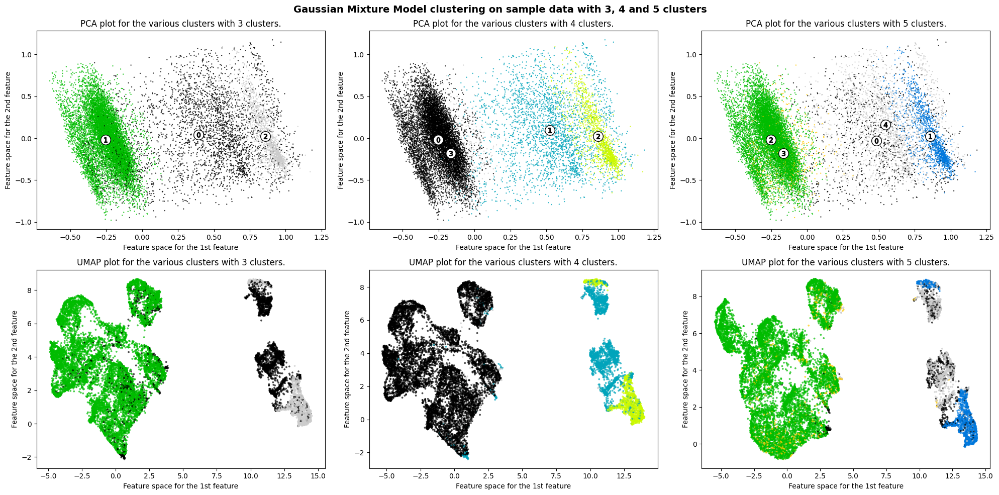

In [120]:
# Plot the clusters
fig, axs = plt.subplots(2, 3, figsize=(20, 10))

for i, cluster in enumerate(['cluster_3', 'cluster_4', 'cluster_5']):
    pca = PCA(n_components=2)
    pca_features = pca.fit_transform(X[numerical_features])
    pca_features = pd.DataFrame(pca_features, columns=['pca_1', 'pca_2'])
    colors = cm.nipy_spectral(X[cluster].astype(float) / X[cluster].max())
    
    axs[0][i].scatter(pca_features['pca_1'], pca_features['pca_2'], marker=".", s=12, lw=0, alpha=0.8, c=colors, edgecolor="k")
        
    # Add the cluster centers
    pca_features['cluster'] = X[cluster]
    centroids = pca_features.groupby('cluster').mean().values
    for centroid, j in zip(centroids, range(len(centroids))):
        axs[0][i].scatter(centroid[0],centroid[1], marker="o", c="white", alpha=1, s=200, edgecolor="k")
        axs[0][i].scatter(centroid[0], centroid[1], marker="$%d$" % j, alpha=1, s=50, edgecolor="k")

    axs[0][i].set_title(f"PCA plot for the various clusters with {i+3} clusters.")
    axs[0][i].set_xlabel("Feature space for the 1st feature")
    axs[0][i].set_ylabel("Feature space for the 2nd feature")

    # Add the UMAP plot ------------------------------------------------------------------------------------
    reducer = UMAP(n_neighbors=100)
    embedding = reducer.fit_transform(X[numerical_features])
    colors = cm.nipy_spectral(X[cluster].astype(float) / X[cluster].max())
    axs[1][i].scatter(embedding[:, 0], embedding[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k")
    axs[1][i].set_title(f"UMAP plot for the various clusters with {i+3} clusters.")
    axs[1][i].set_xlabel("Feature space for the 1st feature")
    axs[1][i].set_ylabel("Feature space for the 2nd feature")

plt.suptitle(("Gaussian Mixture Model clustering on sample data with 3, 4 and 5 clusters"), fontsize=14, fontweight="bold")
plt.tight_layout()
plt.show()

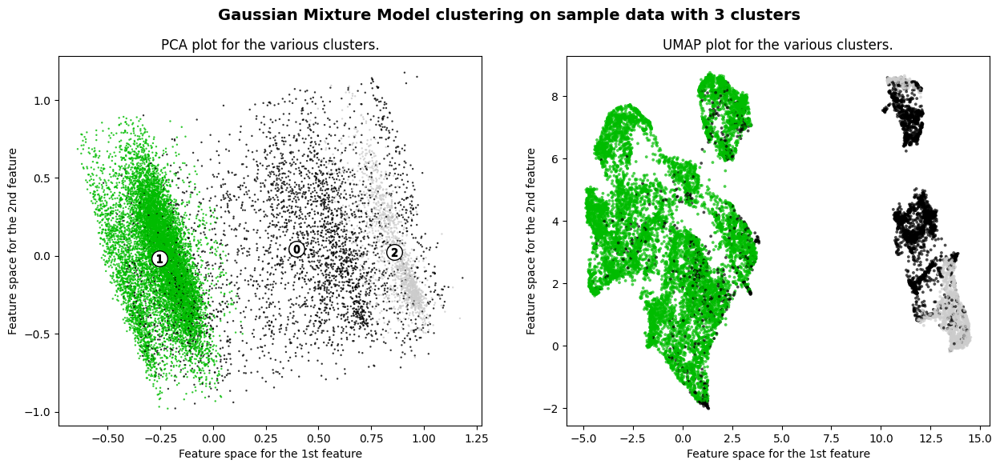

In [143]:
display_clustering(X, gmm3_clusters, title="Gaussian Mixture Model clustering on sample data with 3 clusters", figsize=(15,6))

#####  3 clusters is the maximum we can get with the Gaussian Mixture Model. Otherwise we are just splitting the big cluster into a mess

In [159]:
# Get the means of each cluster
data['cluster_3'] = gmm3_clusters
data[numerical_features + ['cluster_3'] + binary_features].groupby('cluster_3').mean().T.style.background_gradient(axis=1)

cluster_3,0,1,2
n_allowedWeeklyVisits,0.426389,1.000000,0.166667
n_classesVisit,0.348736,0.000016,0.405485
n_frequenciesWeek,0.496920,0.526155,0.458557
n_income,0.456516,0.529001,0.000000
n_ratioUtilization,0.480780,0.452616,0.545413
n_recency,0.347740,0.415538,0.194855
n_spentPerMonth,0.485892,0.372967,0.549032
n_timeAsCustomer,0.667711,0.604252,0.722546
b_combatActivities,0.053744,0.139594,0.008838
b_dropout,0.721316,0.863654,0.547247


### 2.5. Hierarchical Clustering (mostly deterministic)
- 2.5.1. Evaluating the linkage criterion: 'ward', 'complete', 'average', 'single' with the silhouette score
- 2.5.2. Evaluating the distance metric: 'euclidean', 'mahalanobis', 'cityblock', 'cosine', 'l1', 'l2', 'manhattan' with the elbow method
- 2.5.3. Examining the clusters 
______________________________________________________________________

#### 2.5.1. Evaluating the linkage criterion: 'ward', 'complete', 'average', 'single' with the silhouette score and elbow method

Linkage: ward - Clusters: Counter({0: 10816, 1: 4125}) - Silhouette score: 0.3486
Linkage: ward - Clusters: Counter({1: 5849, 2: 4967, 0: 4125}) - Silhouette score: 0.1824
Linkage: ward - Clusters: Counter({0: 5849, 2: 4967, 1: 3027, 3: 1098}) - Silhouette score: 0.1846
Linkage: ward - Clusters: Counter({0: 4967, 2: 4030, 1: 3027, 4: 1819, 3: 1098}) - Silhouette score: 0.1901
Linkage: ward - Clusters: Counter({2: 4030, 5: 3585, 0: 3027, 4: 1819, 1: 1382, 3: 1098}) - Silhouette score: 0.1785
Linkage: ward - Clusters: Counter({2: 4030, 5: 3585, 6: 1839, 4: 1819, 0: 1382, 1: 1188, 3: 1098}) - Silhouette score: 0.1736
Linkage: ward - Clusters: Counter({0: 4030, 2: 3585, 6: 1839, 4: 1819, 1: 1188, 3: 1098, 7: 823, 5: 559}) - Silhouette score: 0.1692
Linkage: complete - Clusters: Counter({0: 11462, 1: 3479}) - Silhouette score: 0.3336
Linkage: complete - Clusters: Counter({0: 9835, 1: 3479, 2: 1627}) - Silhouette score: 0.2137
Linkage: complete - Clusters: Counter({1: 5004, 3: 4831, 0: 3479,

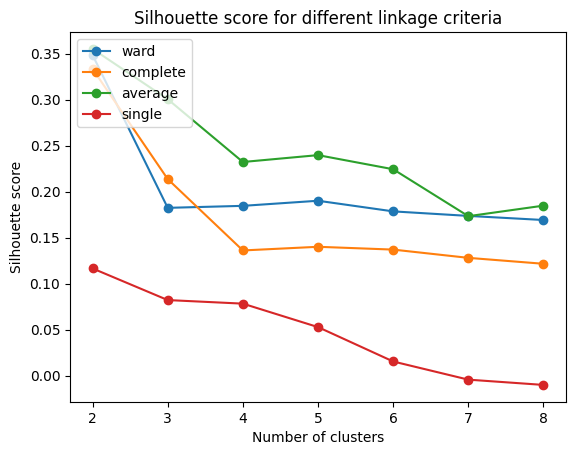

In [12]:
# For every linkage criterion and cluster number, calculate the silhouette score and plot everything
linkage_criteria = ['ward', 'complete', 'average', 'single']
cluster_numbers = [2,3,4,5,6,7,8]
scores = pd.DataFrame()

for linkage in linkage_criteria:
    silhouette_scores = []
    for n_clusters in cluster_numbers:
        # Fit the model
        model = AgglomerativeClustering(n_clusters=n_clusters, linkage=linkage)
        clusters = model.fit_predict(data[numerical_features])

        # Calculate the silhouette score
        score = silhouette_score(data[numerical_features], clusters)
        silhouette_scores.append(score)

        # Calculate the number of clusters
        clusters = Counter(clusters)
        print(f'Linkage: {linkage} - Clusters: {clusters} - Silhouette score: {score:.4f}')

    scores[linkage] = silhouette_scores

# Plot the results
scores.index = cluster_numbers
scores.plot(marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette score')
plt.title('Silhouette score for different linkage criteria')
plt.legend(loc='upper left')
plt.show()

From this we can quickly conclude that the best option is 'average'. However, upon closer inspection and considering our problem, we are confronted with a problem:
- 4 - Linkage: ward - Clusters: Counter({0: 5849, 2: 4967, 1: 3027, 3: 1098}) - Silhouette score: 0.1846
- 5 - Linkage: ward - Clusters: Counter({0: 4967, 2: 4030, 1: 3027, 4: 1819, 3: 1098}) - Silhouette score: 0.1901
- 6 - Linkage: ward - Clusters: Counter({2: 4030, 5: 3585, 0: 3027, 4: 1819, 1: 1382, 3: 1098}) - Silhouette score: 0.1785

__VS__

- 4 - average - Clusters: Counter({1: 10960, 0: 3963, 2: 13, 3: 5}) - Silhouette score: 0.2323
- 5 - average - Clusters: Counter({4: 10960, 0: 2834, 1: 1129, 2: 13, 3: 5}) - Silhouette score: 0.2397
- 6 - average - Clusters: Counter({4: 10960, 2: 2767, 1: 1129, 5: 67, 0: 13, 3: 5}) - Silhouette score: 0.2244

The problem is that there is no balance in the average linkage. And we would like to `break the big cluster into 2 clusters`. So, we will use the ward linkage.


- Complete linkage is also interesting if we want less clusters: 0: 9835, 1: 3479, 2: 1627 - Silhouette score: 0.2137

#### 2.5.2. Evaluating the distance metric - since we are going to use the ward linkage, we will only use the 'euclidean' distance metric

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


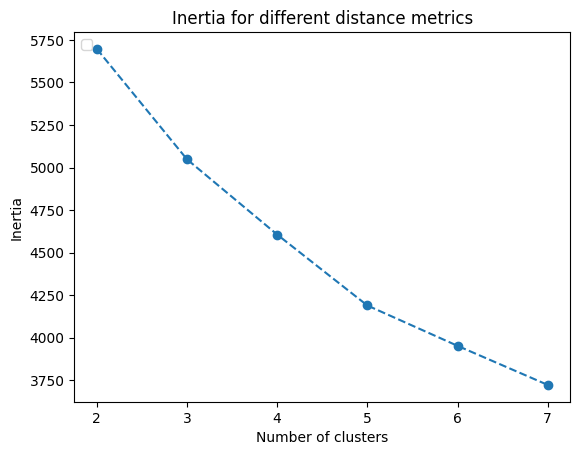

In [24]:
# Using the elbow method to find the optimal number of clusters
inertia = []
for i in range(2, 8):
    model = AgglomerativeClustering(n_clusters=i, linkage='ward')
    labels = model.fit_predict(data[numerical_features])

    # Manually calculate the inertia, as the model does not have an attribute for it
    cluster_centers = pd.DataFrame.groupby(data[numerical_features], labels).mean().values
    inertia.append(np.sum(np.square(data[numerical_features].values - cluster_centers[labels, :])))

# Plot the results
plt.plot(range(2, 8), inertia, marker='o', linestyle='--')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.title('Inertia for different number of clusters - ward linkage + euclidean distance')
plt.show()

From here we would chose 3-5 clusters

#### 2.5.3. Examining the clusters. Using distance threshold instead of n_clusters so that we can use the argument .distances_

##### 5 clusters for the ward linkage seems to be the best option

In [104]:
# Fit the model with 5 clusters
X = data[numerical_features].copy()
model = AgglomerativeClustering(linkage='ward', distance_threshold=26, n_clusters=None)
simple_algorithms['ward_5'] = model
agglomerative_clusters = model.fit_predict(X)

# Add the clusters to the data
X['cluster'] = agglomerative_clusters

# Add the clusters to the results
label_results['ward_5'] = X['cluster']

# Check how the clusters are distributed
clusters = Counter(agglomerative_clusters)
print(clusters)

Counter({0: 4967, 2: 4030, 1: 3027, 4: 1819, 3: 1098})


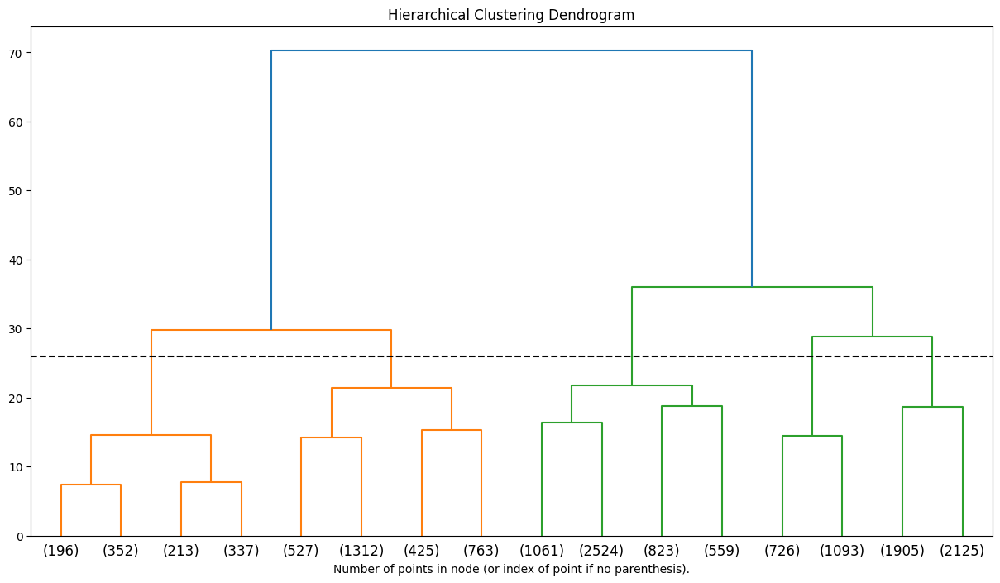

In [105]:
plt.figure(figsize=(15, 8))
plot_dendrogram(model, truncate_mode='level', p=3)
# Plot the distance threshold
plt.axhline(y=26, c='black', linestyle='--')
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

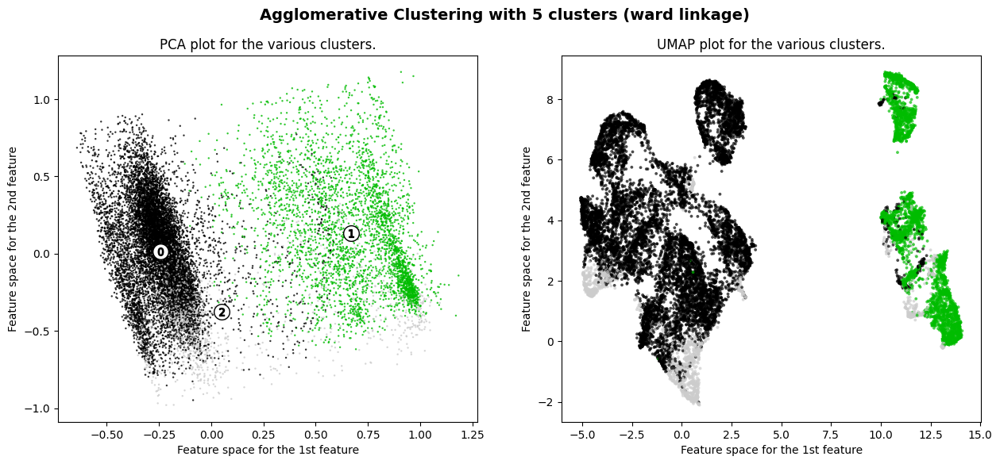

In [89]:
display_clustering(X, agglomerative_clusters, title="Agglomerative Clustering with 5 clusters (ward linkage)", figsize=(15,6))

In [39]:
# What are the clusters like?
X = data.copy()
X['cluster'] = agglomerative_clusters
X[numerical_features+binary_features+['cluster']].groupby('cluster').mean().T.style.background_gradient(axis=1)

cluster,0,1,2,3,4
n_allowedWeeklyVisits,0.994799,0.259443,0.999793,0.220886,0.998992
n_classesVisit,0.010065,0.404280,0.002497,0.402185,0.014422
n_frequenciesWeek,0.575019,0.516249,0.539559,0.333766,0.387749
n_income,0.544049,0.242106,0.482462,0.322742,0.633170
n_ratioUtilization,0.539882,0.674494,0.534587,0.010746,0.056540
n_recency,0.157575,0.250880,0.683279,0.489912,0.453959
n_spentPerMonth,0.413842,0.531600,0.346804,0.434554,0.366153
n_timeAsCustomer,0.621169,0.685936,0.570608,0.710156,0.643946
b_combatActivities,0.129052,0.046250,0.088337,0.022769,0.245739
b_dropout,0.701027,0.589693,0.996526,0.907104,0.927982


##### 3 clusters for complete linkage

In [106]:
# Fit 3 clusters with complete linkage
X = data[numerical_features].copy()
model = AgglomerativeClustering(linkage='complete', n_clusters=None, distance_threshold=2.2)
simple_algorithms['complete_3'] = model
agglomerative_clusters = model.fit_predict(X)

# Add the clusters to the data
X['cluster'] = agglomerative_clusters

# Add the clusters to the results
label_results['complete_3'] = X['cluster']

# Check how the clusters are distributed
clusters = Counter(agglomerative_clusters)
print(clusters)

Counter({0: 9835, 1: 3479, 2: 1627})


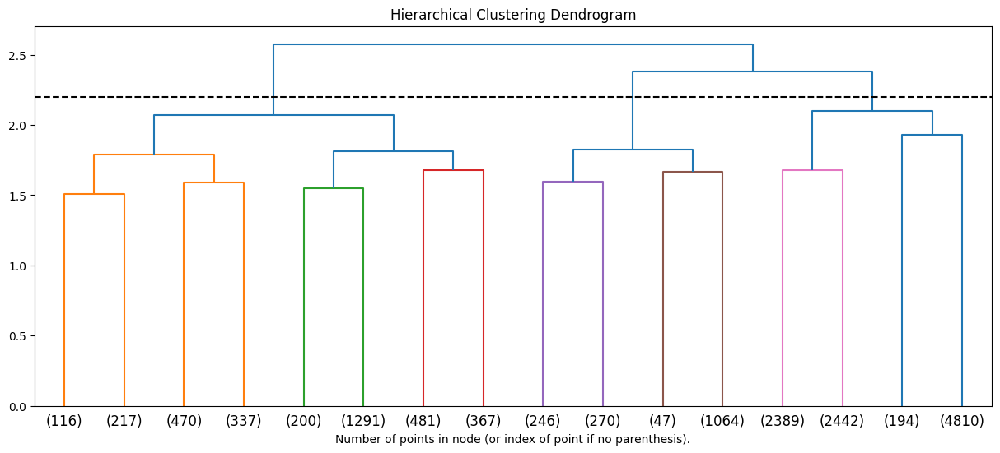

In [107]:
# Plot the dendrogram
plt.figure(figsize=(15, 6))
plot_dendrogram(model, truncate_mode='level', p=3)
# Plot the distance threshold
plt.axhline(y=2.2, c='black', linestyle='--')
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

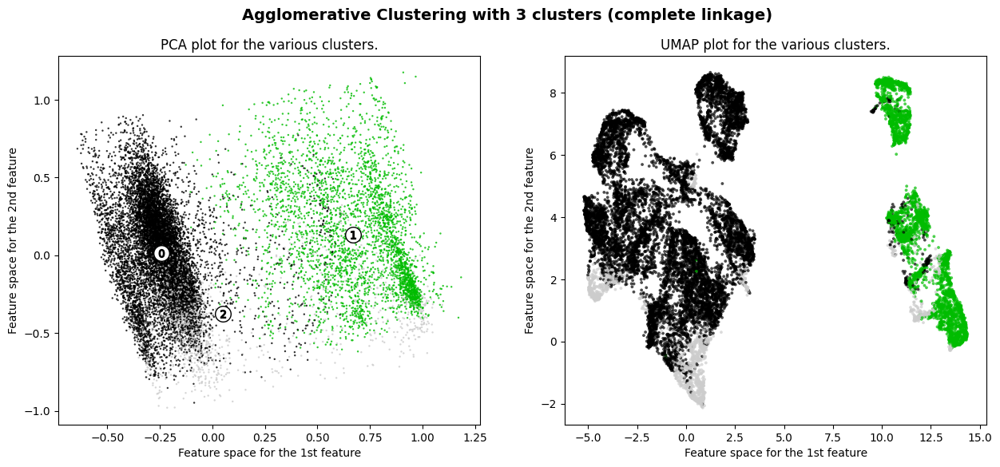

In [88]:
display_clustering(X, agglomerative_clusters, title="Agglomerative Clustering with 3 clusters (complete linkage)", figsize=(15,6))

##### 5 clusters for average linkage (and then unite the small to form 3 clusters)

Counter({4: 10960, 0: 2834, 1: 1129, 2: 13, 3: 5})


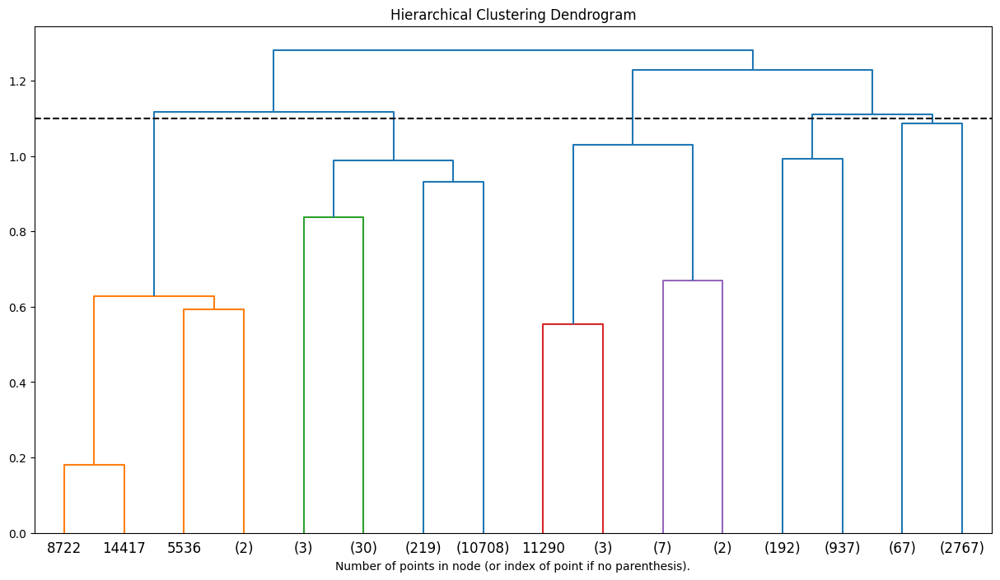

In [123]:
# Average linkage 5 
X = data[numerical_features].copy()
model = AgglomerativeClustering(linkage='average', n_clusters=None, distance_threshold=1.1)
simple_algorithms['average_5'] = model
agglomerative_clusters = model.fit_predict(X)

# Add the clusters to the data
X['cluster'] = agglomerative_clusters

# Check how the clusters are distributed
clusters = Counter(agglomerative_clusters)
print(clusters)

# Plot the dendrogram
plt.figure(figsize=(15, 8))
plot_dendrogram(model, truncate_mode='level', p=3)
# Plot the distance threshold
plt.axhline(y=1.1, c='black', linestyle='--')
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

Lets merge cluster 3 with cluster 4, and cluster 2 with 1, and check the results 

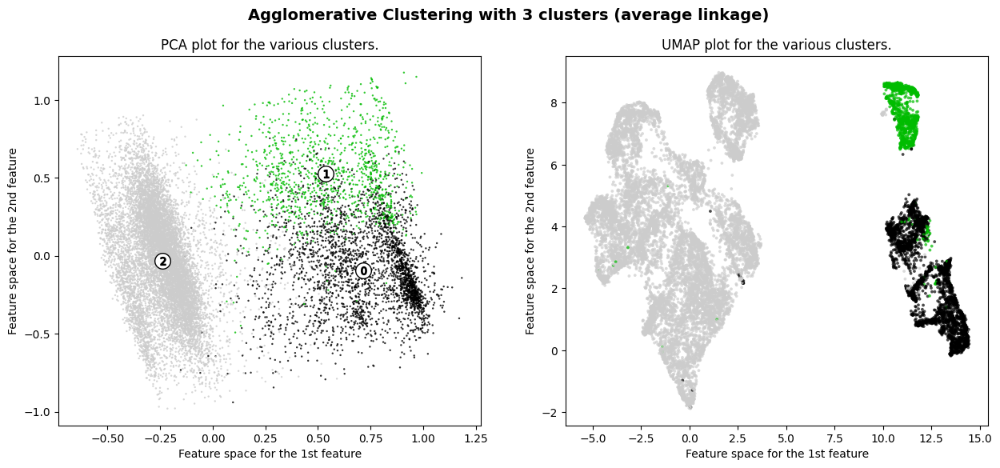

In [124]:
X['cluster'] = X['cluster'].map({0: 0, 1: 1, 2: 1, 3: 2, 4: 2})
agglomerative_clusters = X['cluster'].values

# Add the clusters to the results
label_results['average_5_3'] = X['cluster']

# Check how the clusters are distributed
display_clustering(X, X['cluster'], title="Agglomerative Clustering with 3 clusters (average linkage)", figsize=(15,6))

In [125]:
# How are the clusters like?
X = data.copy()
X['cluster'] = agglomerative_clusters
X[numerical_features+binary_features+['cluster']].groupby('cluster').mean().T.style.background_gradient(axis=1)

cluster,0,1,2
n_allowedWeeklyVisits,0.223559,0.230473,0.995768
n_classesVisit,0.409970,0.399929,0.012136
n_frequenciesWeek,0.515786,0.340448,0.530277
n_income,0.245864,0.317744,0.531321
n_ratioUtilization,0.695120,0.030928,0.454814
n_recency,0.245565,0.502378,0.400341
n_spentPerMonth,0.535754,0.438692,0.381777
n_timeAsCustomer,0.683488,0.702497,0.608578
b_combatActivities,0.034227,0.021891,0.135613
b_dropout,0.575512,0.912434,0.847606


### 2.6. Results
- Average linkage with 3 and 4 clusters provides the best results.

#### Visualization

<img src="../Results/Simple_clustering/ag_ward_5_plot.png"/>
<img src="../Results/Simple_clustering/ms_4_plot.png"/>
<img src="../Results/Simple_clustering/kmeans_4_plot.png"/>
<img src="../Results/Simple_clustering/kmeans_3_plot.png"/>
<img src="../Results/Simple_clustering/gmm_3_plot.png"/>
<img src="../Results/Simple_clustering/dbscan_3_plot.png"/>
<img scr="../Results/Simple_clustering/ag_complete_3_plot.png"/>
<img scr="../Results/Simple_clustering/ag_average_3_plot.png"/>

The KMeans algorithm with 4 clusters seems to be the best option. 

#### Metrics

In [126]:
# Calculate the R2 and silhouette scores for each clustering algorithm and plot on a bar chart
r2_scores, sil_scores = [], []

results_df = pd.DataFrame.from_dict(label_results)

for col in results_df.columns:
    X = data[numerical_features].copy()
    X['cluster'] = results_df[col]
    centroids = X.groupby('cluster').mean().values 
    r2 = calculate_r2(X, centroids)
    r2_scores.append(r2)

    sil = silhouette_score(X.drop(columns = 'cluster'), results_df[col])
    sil_scores.append(sil)

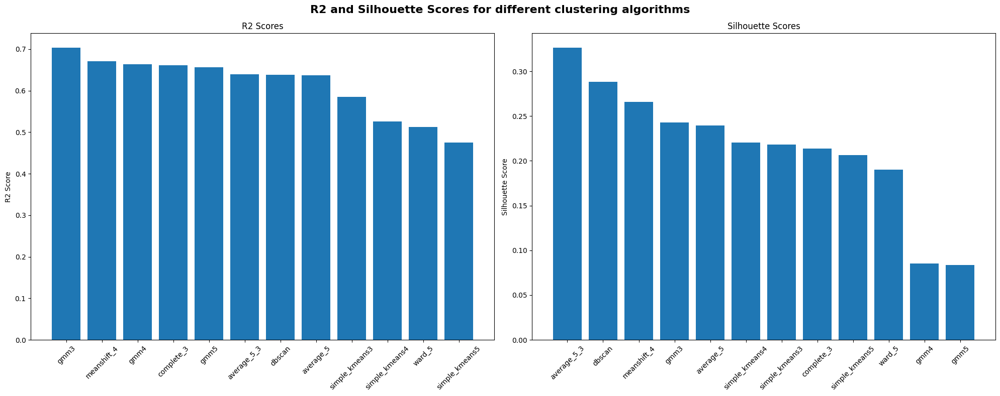

In [127]:
# Plot the results 
fig, axs = plt.subplots(1, 2, figsize=(20, 8))

fig.suptitle('R2 and Silhouette Scores for different clustering algorithms', fontsize=16, fontweight='bold')

r2_ = pd.DataFrame({'r2': r2_scores}, index=results_df.columns)
sil_ = pd.DataFrame({'sil': sil_scores}, index=results_df.columns)

# Order the results 
r2_.sort_values(by='r2', inplace=True, ascending=False)
sil_.sort_values(by='sil', inplace=True, ascending=False)

axs[0].bar(r2_.index, r2_['r2'].values)
axs[0].set_title('R2 Scores')
axs[0].set_ylabel('R2 Score')
axs[0].xaxis.set_tick_params(rotation=45)

axs[1].bar(sil_.index, sil_['sil'].values)
axs[1].set_title('Silhouette Scores')
axs[1].set_ylabel('Silhouette Score')
axs[1].xaxis.set_tick_params(rotation=45)

plt.tight_layout()
plt.show()

#### Using the outliers removed data and check if the results are better

In [143]:
r2_noOutliers, sil_noOutliers = [], []

for model in simple_algorithms:
    if model in ['average_5', 'meanshift', 'dbscan']:   # Average 5 is a little harder to cluster, so we skip it. The others dont have a fixed number of clusters
        continue
    
    X = data_outliers_removed[numerical_features].copy()
    
    # Fit the model to X
    clusters = simple_algorithms[model].fit_predict(X)
    X['cluster'] = clusters
    centroids = X.groupby('cluster').mean().values
    r2 = calculate_r2(X, centroids)

    # Calculate the silhouette score
    sil = silhouette_score(X.drop(columns='cluster'), clusters)

    # Save the data
    r2_noOutliers.append(r2)
    sil_noOutliers.append(sil)

We will use the average linkage with 3 clusters, instead of 5 and then merging, because merging is not needed anymore (without the outliers). We will also include the approach with 4 clusters, as it is a great option.

In [173]:
# Fit the average 3 to the outlier removed data
X = data_outliers_removed[numerical_features].copy()
model = AgglomerativeClustering(linkage='average', n_clusters=3)
agglomerative_clusters = model.fit_predict(X)
X['cluster'] = agglomerative_clusters
print(Counter(X['cluster']))
agglomerative_clusters = X['cluster'].values

# Calculate the R2 and silhouette scores 
centroids = X.groupby('cluster').mean().values
r2_3 = calculate_r2(X, centroids)
sil_3 = silhouette_score(X.drop(columns='cluster'), agglomerative_clusters)

# Fit the average 4 to the outlier removed data
X = data_outliers_removed[numerical_features].copy()
model = AgglomerativeClustering(linkage='average', n_clusters=4)
agglomerative_clusters = model.fit_predict(X)
X['cluster'] = agglomerative_clusters
print(Counter(X['cluster']))
agglomerative_clusters = X['cluster'].values

# Calculate the R2 and silhouette scores
centroids = X.groupby('cluster').mean().values
r2_4 = calculate_r2(X, centroids)
sil_4 = silhouette_score(X.drop(columns='cluster'), agglomerative_clusters)

Counter({1: 10924, 0: 2673, 2: 1051})
Counter({0: 10924, 3: 2022, 2: 1051, 1: 651})


In [177]:
index_ = ['simple_kmeans4', 'simple_kmeans3', 'simple_kmeans5', 'gmm3', 'gmm4', 'gmm5', 'ward_5', 'complete_3']
r2_no = pd.DataFrame({'r2_NO': r2_noOutliers}, index=index_)
sil_no = pd.DataFrame({'sil_NO': sil_noOutliers}, index=index_)

r2_no.loc['average_3'] = r2_3
sil_no.loc['average_3'] = sil_3
r2_no.loc['average_4'] = r2_4
sil_no.loc['average_4'] = sil_4

metric_df = pd.concat([r2_, sil_, r2_no, sil_no], axis=1)
metric_df

,r2,sil,r2_NO,sil_NO
gmm3,0.702872,0.242765,0.698154,0.248614
meanshift_4,0.670801,0.266030,NaN,NaN
gmm4,0.664105,0.085155,0.657762,0.078747
complete_3,0.661537,0.213678,0.739426,0.109544
gmm5,0.655744,0.083711,0.613456,0.068428
average_5_3,0.639460,0.326201,NaN,NaN
dbscan,0.638517,0.288344,NaN,NaN
average_5,0.636667,0.239738,NaN,NaN
simple_kmeans3,0.585202,0.218392,0.575803,0.223529
simple_kmeans4,0.526013,0.220215,0.517378,0.224380


It is useless to do this for meanshift and dbscan, as they will not retain their original cluster number. 

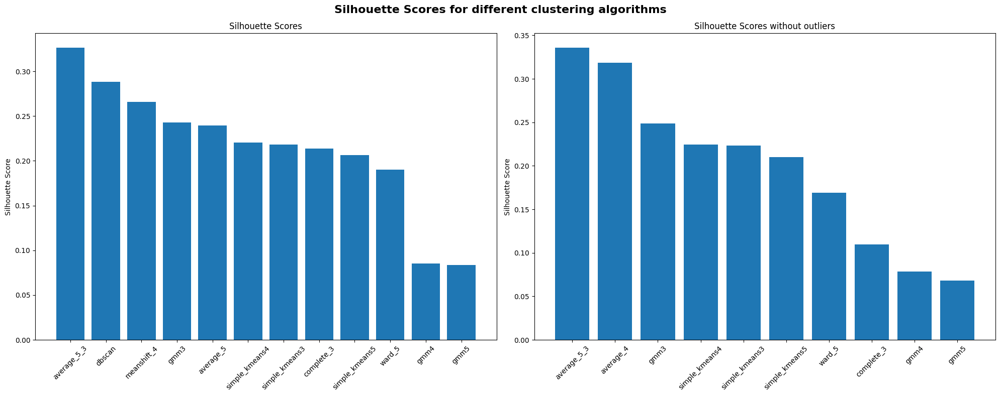

In [175]:
# Plot the best silhouette scores for each algorithm 
fig, axs = plt.subplots(1, 2, figsize=(20, 8))

fig.suptitle('Silhouette Scores for different clustering algorithms', fontsize=16, fontweight='bold')

sil_ = sil_.sort_values(by='sil', ascending=False)
sil_no = sil_no.sort_values(by='sil_NO', ascending=False)

axs[0].bar(sil_.index, sil_['sil'].values)
axs[0].set_title('Silhouette Scores')
axs[0].set_ylabel('Silhouette Score')
axs[0].xaxis.set_tick_params(rotation=45)

axs[1].bar(sil_no.index, sil_no['sil_NO'].values)
axs[1].set_title('Silhouette Scores without outliers')
axs[1].set_ylabel('Silhouette Score')
axs[1].xaxis.set_tick_params(rotation=45)

plt.tight_layout()
plt.show()

##### Visualizing the average linkage with 4 clusters

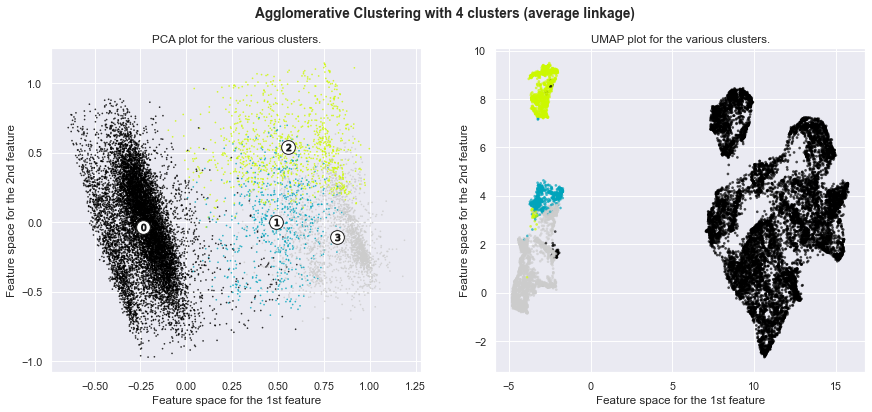

In [278]:
# Fit average linkage with 4 clusters to the data without outliers
X = data_outliers_removed[numerical_features].copy()
model = AgglomerativeClustering(linkage='average', n_clusters=4)
agglomerative_clusters = model.fit_predict(X)
X['cluster'] = agglomerative_clusters

# Display the clusters
display_clustering(X, agglomerative_clusters, title="Agglomerative Clustering with 4 clusters (average linkage)", figsize=(15,6))

In [280]:
# How are the clusters like?
X = data_outliers_removed.copy()
X['cluster'] = agglomerative_clusters
print(Counter(X['cluster']))
X[numerical_features+binary_features+['cluster']+dropped].groupby('cluster').mean().T.style.background_gradient(axis=1)

Counter({0: 10924, 3: 2022, 2: 1051, 1: 651})


cluster,0,1,2,3
n_allowedWeeklyVisits,0.996201,0.193856,0.219156,0.215447
n_classesVisit,0.010440,0.423250,0.420955,0.414740
n_frequenciesWeek,0.531904,0.537966,0.345989,0.509526
n_income,0.531174,0.719375,0.306112,0.069487
n_ratioUtilization,0.457266,0.701118,0.015309,0.692795
n_recency,0.399337,0.469970,0.504160,0.174317
n_spentPerMonth,0.382321,0.454695,0.432066,0.555243
n_timeAsCustomer,0.608346,0.667808,0.711535,0.696418
b_combatActivities,0.135665,0.004608,0.022835,0.043027
b_dropout,0.845569,0.821813,0.917222,0.500989


## __3. Complex Clustering Models__

### 3.1. Clustering on top of a self-organizing map (SOM)
- Unsatisfied with the results. Poor silhouette scores and leakage of clusters. We will not use this method.
____________________________________________________________________

### 3.1.0 SOM for visualization purposes

#### 3.1.0.1 Building a SOM

In [191]:
# Build the SOM
X = data_outliers_removed[numerical_features].copy()
mapsize = [10,10]

som = SOMFactory().build(X.values, 
                             mapsize, 
                             mask=None, 
                             mapshape='planar', 
                             lattice='hexa', 
                             normalization='var', 
                             initialization='random', 
                             neighborhood='gaussian', 
                             training='batch', 
                             name='sompy', 
                             component_names=X.columns,
)

som.train(n_job=4, verbose='info', train_rough_len=100, train_finetune_len=100)

 Training...
 random_initialization took: 0.001000 seconds
 Rough training...
 radius_ini: 4.000000 , radius_final: 1.000000, trainlen: 100

 epoch: 1 ---> elapsed time:  0.058000, quantization error: 2.342224

 epoch: 2 ---> elapsed time:  0.052000, quantization error: 2.678357

 epoch: 3 ---> elapsed time:  0.050000, quantization error: 2.627252

 epoch: 4 ---> elapsed time:  0.049000, quantization error: 2.604132

 epoch: 5 ---> elapsed time:  0.052000, quantization error: 2.578946

 epoch: 6 ---> elapsed time:  0.050000, quantization error: 2.566054

 epoch: 7 ---> elapsed time:  0.052000, quantization error: 2.558379

 epoch: 8 ---> elapsed time:  0.045000, quantization error: 2.549688

 epoch: 9 ---> elapsed time:  0.048000, quantization error: 2.535070

 epoch: 10 ---> elapsed time:  0.048000, quantization error: 2.527286

 epoch: 11 ---> elapsed time:  0.046000, quantization error: 2.523759

 epoch: 12 ---> elapsed time:  0.055000, quantization error: 2.520514

 epoch: 13 ---> 

#### 3.1.0.2 Component Planes

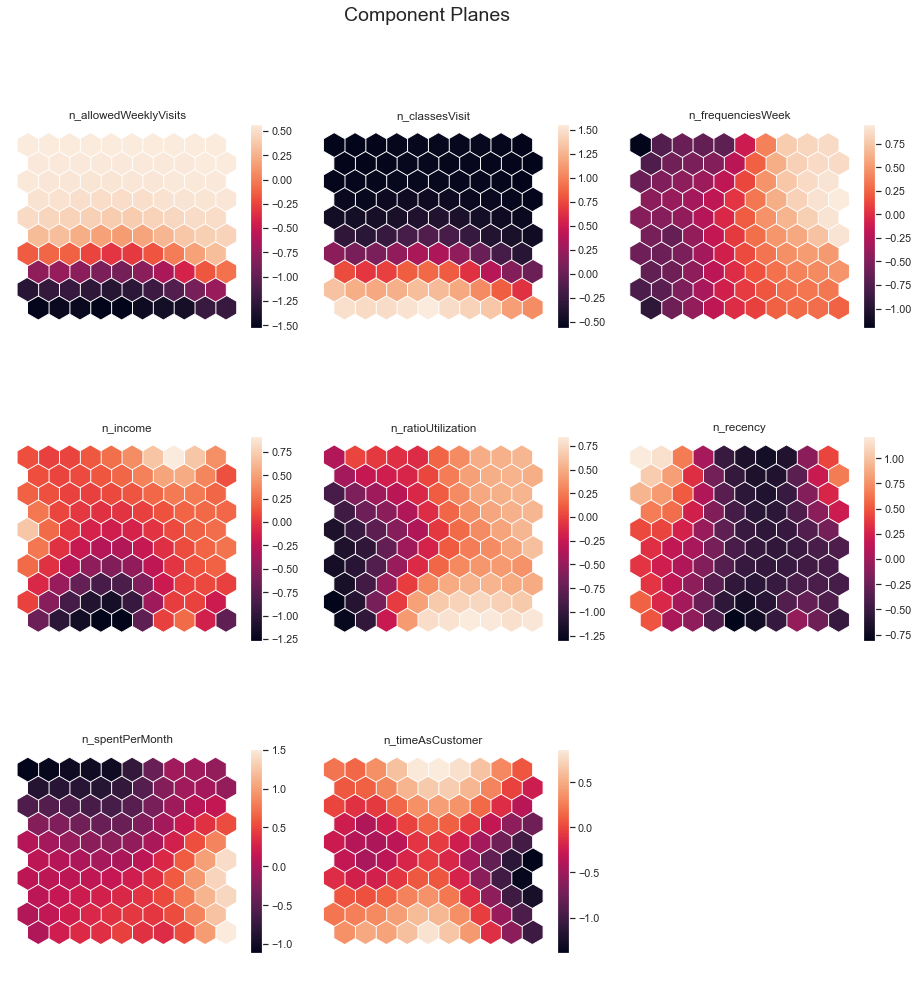

In [194]:
plt.rcParams['figure.dpi'] = 70


# Visualizing the Component planes (feature values)
sns.set()
view2D = View2D(25, 25, "", text_size=10)
view2D.show(som, col_sz=3, what='codebook')
plt.subplots_adjust(top=0.90)
plt.suptitle("Component Planes", fontsize=20)
plt.show()

#### 3.1.0.3 U-Matrix

c:\Python311\Lib\site-packages\sompy\visualization\umatrix.py:60: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(X, Y, s=2, alpha=1., c='Gray',


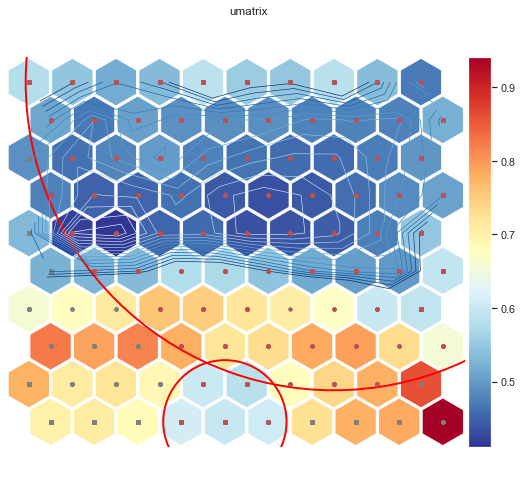

In [199]:
u = UMatrixView(9, 9, 'umatrix', show_axis=True, text_size=8, show_text=True)

UMAT = u.show(
    som, 
    distance=2,
    row_normalized=False,
    show_data=True, 
    contour=True, # Visualize isomorphic curves
    blob=True
)

np.flip(UMAT[1], axis=1) # U-matrix values - they match with the plot colors

plt.show()

#### 3.1.0.4 Hit Map

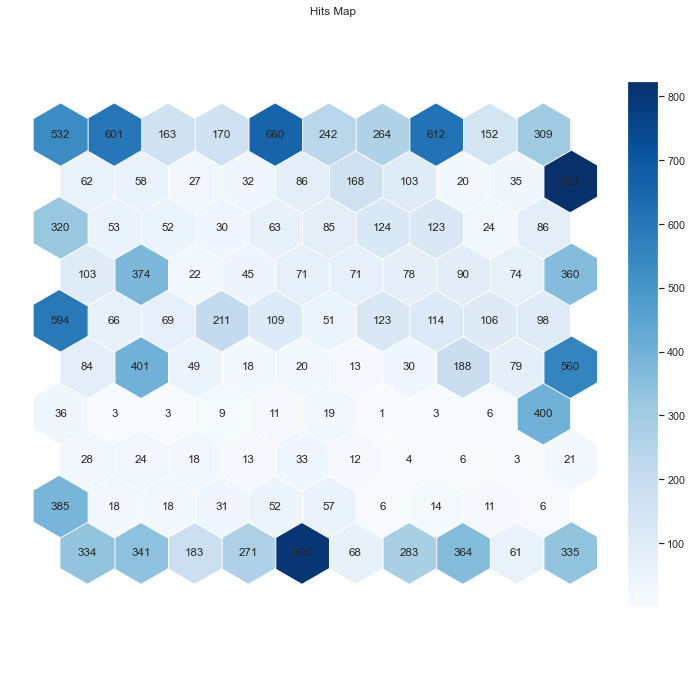

In [200]:
vhts  = BmuHitsView(12,12,"Hits Map")
vhts.show(som, anotate=True, onlyzeros=False, labelsize=12, cmap="Blues")
plt.show()

### 3.1.1 Clustering on top of a self-organizing map (SOM)

#### Building the SOM:
- We use only the standard dataframe, as the one without the outliers doesnt work as well

In [202]:
np.random.seed(0)
X = data[numerical_features].copy()

som = SOMFactory().build(
    X.values,
    mapsize=[50,50], 
    initialization='random',
    neighborhood='gaussian',
    training='batch',
    lattice='hexa',
    component_names=X.columns
)

som.train(n_job=4, verbose='info', train_rough_len=100, train_finetune_len=200)

 Training...
 random_initialization took: 0.001000 seconds
 Rough training...
 radius_ini: 17.000000 , radius_final: 2.833333, trainlen: 100

 epoch: 1 ---> elapsed time:  0.484000, quantization error: 1.454945

 epoch: 2 ---> elapsed time:  0.440000, quantization error: 2.711689

 epoch: 3 ---> elapsed time:  0.438000, quantization error: 2.688906

 epoch: 4 ---> elapsed time:  0.428000, quantization error: 2.674617

 epoch: 5 ---> elapsed time:  0.426000, quantization error: 2.665308

 epoch: 6 ---> elapsed time:  0.382000, quantization error: 2.661898

 epoch: 7 ---> elapsed time:  0.365000, quantization error: 2.660307

 epoch: 8 ---> elapsed time:  0.376000, quantization error: 2.658983

 epoch: 9 ---> elapsed time:  0.396000, quantization error: 2.657671

 epoch: 10 ---> elapsed time:  0.378000, quantization error: 2.656368

 epoch: 11 ---> elapsed time:  0.368000, quantization error: 2.655058

 epoch: 12 ---> elapsed time:  0.427000, quantization error: 2.653738

 epoch: 13 --->

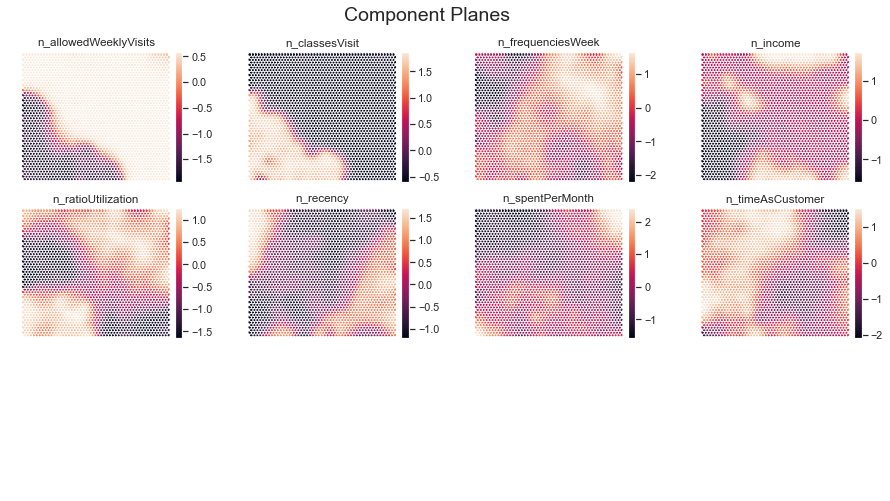

In [203]:
# Component planes on the 50x50 grid
sns.set()
view2D = View2D(12,10,"", text_size=10)
view2D.show(som, col_sz=4, what='codebook')
plt.subplots_adjust(top=0.90)
plt.suptitle("Component Planes", fontsize=20)
plt.show()

#### Umatrix:

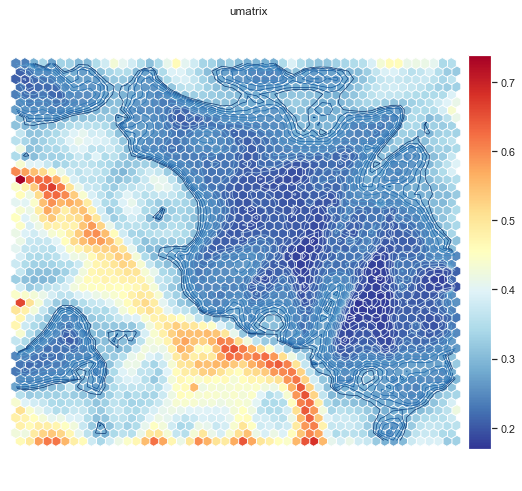

In [205]:
# U-matrix of the 50x50 grid
u = UMatrixView(10,10, 'umatrix', show_axis=True, text_size=8, show_text=True)

UMAT = u.show(
    som, 
    distance=2, 
    row_normalized=False, 
    show_data=False, 
    contour=True
)

#### 3 clusters: 

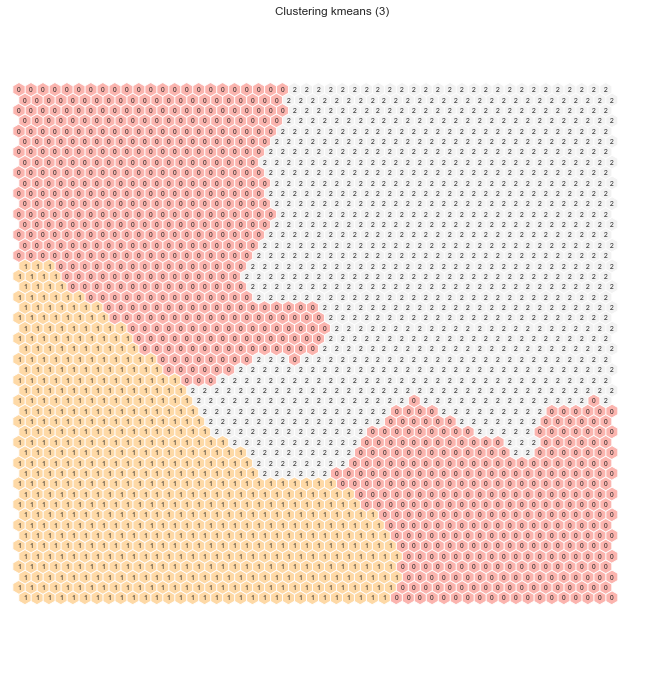

In [206]:
kmeans = KMeans(n_clusters=3, init='k-means++', n_init=20, random_state=42)
kmeans_3_nodeclus = kmeans.fit_predict(som.codebook.matrix)
som.cluster_labels = kmeans_3_nodeclus

hits = HitMapView(12, 12,"Clustering kmeans (3)", text_size=10)
hits.show(som, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

plt.show()

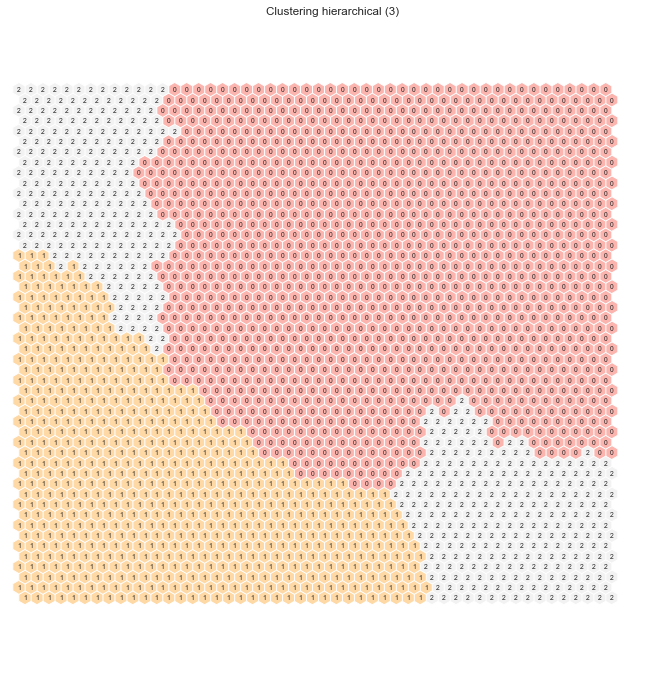

In [207]:
hierclust = AgglomerativeClustering(n_clusters=3, linkage='ward')
hierclust_3_nodeclus = hierclust.fit_predict(som.codebook.matrix)
som.cluster_labels = hierclust_3_nodeclus

hits  = HitMapView(12, 12,"Clustering hierarchical (3)",text_size=10)
hits.show(som, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

plt.show()

#### 4 clusters:

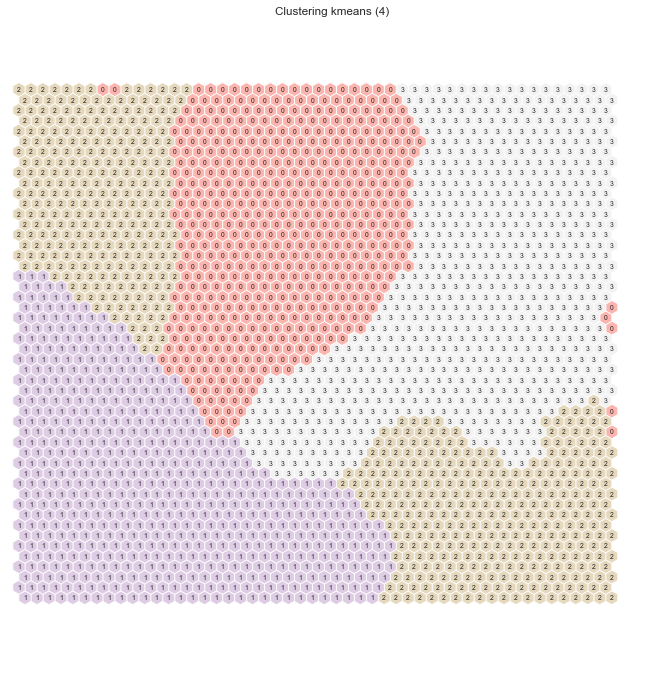

In [208]:
kmeans = KMeans(n_clusters=4, init='k-means++', n_init=20, random_state=42)
kmeans_4_nodeclus = kmeans.fit_predict(som.codebook.matrix)
som.cluster_labels = kmeans_4_nodeclus

hits = HitMapView(12, 12,"Clustering kmeans (4)", text_size=10)
hits.show(som, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

plt.show()

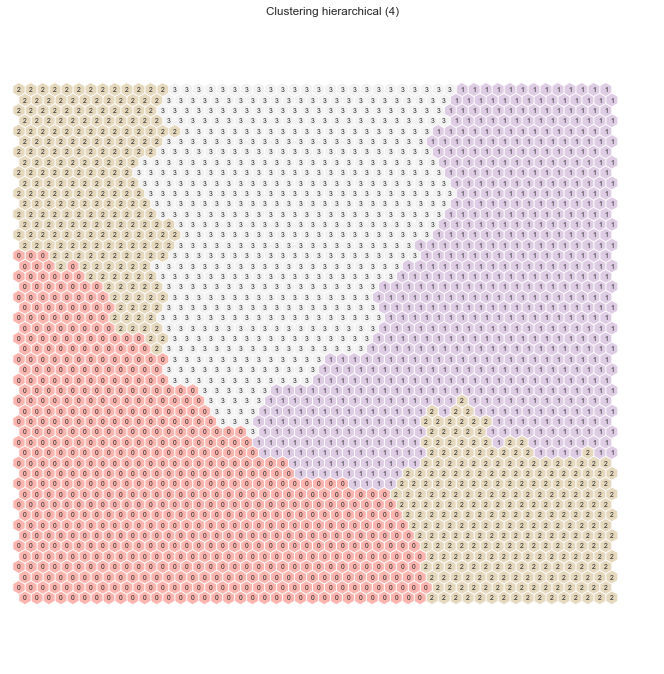

In [245]:
hierclust = AgglomerativeClustering(n_clusters=4, linkage='ward')
hierclust_4_nodeclus = hierclust.fit_predict(som.codebook.matrix)
som.cluster_labels = hierclust_4_nodeclus

hits  = HitMapView(12, 12,"Clustering hierarchical (4)",text_size=10)
hits.show(som, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

plt.show()

#### Getting the cluster labels:

In [210]:
# Check the nodes and and respective clusters
clusters_unconverted = {'Kmeans 3': kmeans_3_nodeclus, 'Hierarchical 3': hierclust_3_nodeclus, 'Kmeans 4': kmeans_4_nodeclus, 'Hierarchical 4': hierclust_4_nodeclus}
nodes = som.codebook.matrix

clustering_results = {}

for clustering, name in zip(clusters_unconverted.values(), clusters_unconverted.keys()):
    df_nodes = pd.DataFrame(nodes, columns=numerical_features)
    df_nodes['label'] = clustering

    # Obtaining SOM's BMUs labels
    bmus_map = som.find_bmu(data[numerical_features])[0]  # get bmus for each observation in df

    df_bmus = pd.DataFrame(
        np.concatenate((data, np.expand_dims(bmus_map,1)), axis=1),
        index=data.index, columns=np.append(data.columns,"BMU")
    )

    # Get cluster labels for each observation
    df_final = df_bmus.merge(df_nodes['label'], 'left', left_on="BMU", right_index=True)
    
    # Characterizing the final clusters
    print(f'{name}:', Counter(df_final['label']))

    clustering_results[name] = df_final['label']

Kmeans 3: Counter({2: 13782, 1: 711, 0: 448})
Hierarchical 3: Counter({0: 13154, 1: 1787})
Kmeans 4: Counter({3: 11717, 0: 2171, 1: 711, 2: 342})
Hierarchical 4: Counter({1: 11811, 0: 1787, 3: 1343})


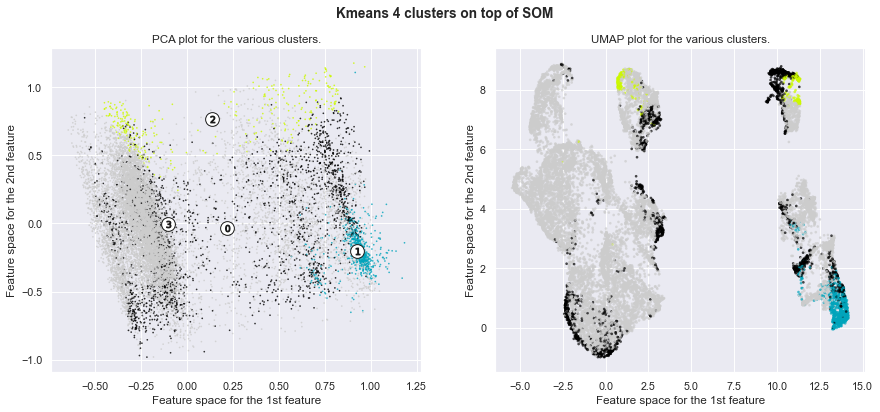

In [271]:
# Visualize Kmeans 4 clusters
display_clustering(data, clustering_results['Kmeans 4'], title="Kmeans 4 clusters on top of SOM", figsize=(15,6))

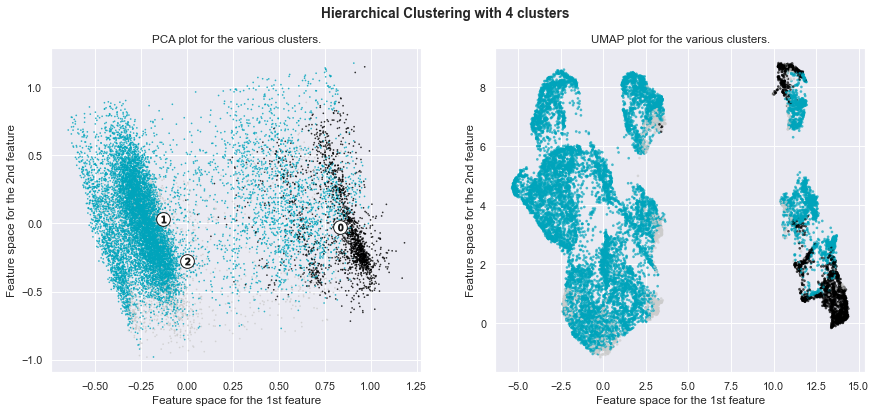

In [270]:
# Visualize the hierarchical clustering with 4 clusters
display_clustering(data, clustering_results['Hierarchical 4'], title="Hierarchical Clustering on top of SOM with 4 clusters", figsize=(15,6))

We will just use the Kmeans 4 clusters and hierarchical 4

In [248]:
# How are the clusters like?
X = data.copy()
X['cluster'] = clustering_results['Kmeans 4']
X[numerical_features+binary_features+['cluster']+dropped].groupby('cluster').mean().T.style.background_gradient(axis=1)

results_df['SOM_kmeans_4'] = clustering_results['Kmeans 4']

Hierarchical 4:

In [259]:
# Hierarchy 4
X = data.copy()
X['cluster'] = clustering_results['Hierarchical 4']
X[numerical_features+binary_features+['cluster']+dropped].groupby('cluster').mean().T.style.background_gradient(axis=1)

results_df['SOM_hier_4'] = clustering_results['Hierarchical 4'] 

## __4. Final Results__
- The best two options are the hierarchical clustering with 3 and 4 clusters for the outlier removed data with the linkage type 'average'. 
- We will choose the 4 clusters option, as it is the best option for the business.
________________________________________________________________

In [287]:
# Lets see how the clusters are distributed - 4 clusters
agglomerative_clusters = AgglomerativeClustering(n_clusters=4, linkage='average').fit_predict(data_outliers_removed[numerical_features])
X = data_outliers_removed.copy()
X['cluster'] = agglomerative_clusters
print(Counter(X['cluster']))
X[numerical_features+binary_features+['cluster']+['drop_n_age', 'drop_n_lifetimeValue']].groupby('cluster').mean().T.style.background_gradient(axis=1)

Counter({0: 10924, 3: 2022, 2: 1051, 1: 651})


cluster,0,1,2,3
n_allowedWeeklyVisits,0.996201,0.193856,0.219156,0.215447
n_classesVisit,0.010440,0.423250,0.420955,0.414740
n_frequenciesWeek,0.531904,0.537966,0.345989,0.509526
n_income,0.531174,0.719375,0.306112,0.069487
n_ratioUtilization,0.457266,0.701118,0.015309,0.692795
n_recency,0.399337,0.469970,0.504160,0.174317
n_spentPerMonth,0.382321,0.454695,0.432066,0.555243
n_timeAsCustomer,0.608346,0.667808,0.711535,0.696418
b_combatActivities,0.135665,0.004608,0.022835,0.043027
b_dropout,0.845569,0.821813,0.917222,0.500989
